#Parcial 2 SyS
##Preguntas:
1- Sea el demodulador en amplitud presentado en la siguiente Figura:
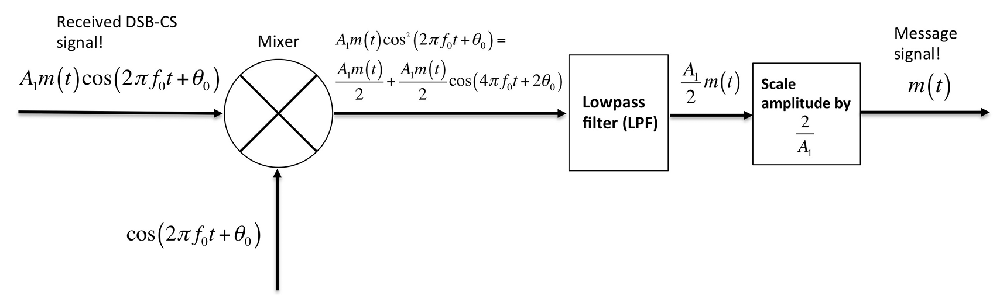

Asumiendo $θ_0=0$, determine el espectro de Fourier (teórico) en cada una de las etapas del sistema. Luego, con base en la simulación de amplitud del Taller 2 y utilizando 5 segundos de una canción de YouTube como mensaje, grafique cada una de las etapas principales del proceso de modulación y demodulación en el tiempo y la frecuencia (reproduzca el segmento de la canción en cada etapa).

Nota: Para la etapa de filtrado pasa bajas, realice su implementación a partir de la transformada rápida de Fourier.

###R=/
Lo primero que nos piden es determinar el espectro de Fourier en cada etapa del sistema asumiendo $θ_0=0$. Para esto definimos la *"Received DSB-CS signal!"* en Sympy:

In [1]:
import sympy as sp
t = sp.symbols('t',real=True) #definimos la variable t, el tiempo es una variable real
m = sp.Function('m')(t) #definimos el mensaje, una función que depende del tiempo
A1 = sp.symbols('A1', real=True) #definimos la amplitud, diremos que esta amplitud es también una variable real
f0 = sp.symbols('f0', real=True) #definimos la frecuencia, tambien es real
sign1 = A1*m*sp.cos(2*sp.pi*f0*t) #señal recibida DSB-CS, no ponemos la suma de theta ya que theta es igual a 0 en este caso
sign1

A1*m(t)*cos(2*pi*f0*t)

El espectro de Fourier por su parte se determina al aplicar la transformada de Fourier a la función. Esta se calcula por definición como:

$\begin {equation}
F\{x(t)\}=\int_{-∞}^∞ x(t) e^{-jωt} dt
\end {equation}$

Asi que definimos el euler complejo por Sympy:

In [2]:
omega = sp.symbols('omega', real=True)
eulercomp = sp.exp(-sp.I*omega*t) #sp.I es el imaginario de sympy para que no nos de errores
eulercomp

exp(-I*omega*t)

Y creamos la función transformada de Fourier:

In [3]:
def transfou (arg=sp.Function('x')(t)):
  fouespec = sp.integrate(arg*eulercomp, (t,-sp.oo,sp.oo)) #calcula el espectro
  return fouespec #lo devuelve

Ahora hacemos transformada de Fourier a nuestra *"Received DSB-CS signal!"*:

In [4]:
especsign1 = transfou(sign1)
especsign1

A1*Integral(m(t)*exp(-I*omega*t)*cos(2*pi*f0*t), (t, -oo, oo))

¿Que ha pasado? Sympy no puede hacer esa integral pues no conoce a $m(t)$, asi que lo haremos a mano.

Sea nuestra señal *"DSB-CS"*

\begin{equation}
A_1m(t)Cos(2\pi f_0t)
\end{equation}

Sabemos que:

\begin{equation}
Cos(θ)=\frac{e^{jθ}+e^{-jθ}}{2}
\end{equation}

Luego:

\begin{equation}
Cos(2πf_0t)=\frac{e^{j2πf_0t}+e^{-j2πf_0t}}{2}
\end{equation}

Con lo cual:

\begin{equation}
A_1m(t)Cos(2\pi f_0t)=A_1m(t)\left[\frac{e^{j2πf_0t}+e^{-j2πf_0t}}{2}\right]=\frac{A_1}{2}\left[m(t)e^{j2πf_0t}+m(t)e^{-j2πf_0t}\right]
\end{equation}

Asi, al aplicar Fourier:

\begin{equation}
F\left\{A_1m(t)Cos(2\pi f_0t)\right\}=\frac{A_1}{2}\left[F\left\{m(t)e^{j2πf_0t}\right\}+F\left\{m(t)e^{-j2πf_0t}\right\}\right]
\end{equation}

Para solucionar esto, vamos a suponer que queremos aplicar transformada de Fourier a una señal $x(t)$, tal que:

\begin{equation}
F\{x(t)\}=∫^∞_{-∞}x(t)e^{-jwt}dt=X(w)
\end{equation}

Luego si queremos aplicar transformada de Fourier a una señal $x(t)e^{±jw_0t}$ nos queda:

\begin{equation}
F\{x(t)e^{±jw_0t}\}=∫^∞_{-∞}x(t)e^{±jw_0t}e^{-jwt}dt=∫^∞_{-∞}x(t)e^{±jw_0t-jwt}dt=∫^∞_{-∞}x(t)e^{-j(w\mp w_0)t}dt = X(w\mp w_0)
\end{equation}

Eso quiere decir que:

\begin{equation}
F\left\{A_1m(t)Cos(2\pi f_0t)\right\}=\frac{A_1}{2}\left[F\left\{m(t)e^{j2πf_0t}\right\}+F\left\{m(t)e^{-j2πf_0t}\right\}\right]=\frac{A_1}{2}[M(w-2πf_0)+M(w+2πf_0)]
\end{equation}

Luego del mixer la señal queda:

\begin{equation}
A_1m(t)Cos^2(2πf_0t)=\frac{A_1m(t)}{2}+\frac{A_1m(t)Cos(4πf_0t)}{2}
\end{equation}

Nuevamente:

\begin{equation}
Cos(θ)=\frac{e^{jθ}+e^{-jθ}}{2}
\end{equation}

Luego:

\begin{equation}
Cos(4πf_0t)=\frac{e^{j4πf_0t}+e^{-j4πf_0t}}{2}
\end{equation}

Asi el espectro de Fourier será:

\begin{equation}
F\left\{A_1m(t)Cos^2(2\pi f_0t)\right\}=F\left\{\frac{A_1m(t)}{2}+\frac{A_1m(t)Cos(4πf_0t)}{2}\right\}=\frac{A_1}{2}\left[F\left\{m(t)\right\}+\frac{1}{2}F\left\{m(t)e^{j4πf_0t}\right\}+\frac{1}{2}F\left\{m(t)e^{-j4πf_0t}\right\}\right]=\frac{A_1}{2}[M(w)+\frac{M(w-4πf_0)+M(w+4πf_0)}{2}]
\end{equation}

Luego del *"Lowpass Filter"* la señal queda:

\begin{equation}
\frac{A_1m(t)}{2}
\end{equation}

Por lo cual su espectro de Fourier es evidentemente:

\begin{equation}
F\left\{\frac{A_1m(t)}{2}\right\}=\frac{A_1M(w)}{2}
\end{equation}

Finalmente luego del *"Scale Amplitude"*:

\begin{equation}
F\left\{m(t)\right\}=M(w)
\end{equation}

Despues de hacer las transformadas de Fourier a mano, nos piden usar una canción de Youtube como mensaje graficar cada una de las etapas principales del proceso de modulación y demodulación en el tiempo y la frecuencia, para esto primero vamos a descargar una cancion:

In [5]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz
link="https://www.youtube.com/watch?v=v2H4l9RpkwM" #link de la canción de esta ocasión
!yt-dlp --cookies www.youtube.com_cookies.txt --extract-audio -o "cancion" --audio-format mp3 {link}

     - 2.9 MB 9.4 MB/s 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for yt-dlp: filename=yt_dlp-2025.11.12-py3-none-any.whl size=3036379 sha256=b50e76e6643050cd795dddfdbb68c00629345a70781f325965d8500f3dce6689
  Stored in directory: /tmp/pip-ephem-wheel-cache-10ntetwv/wheels/b6/70/13/8d2d11b326f983030b72df6408392d5c1b3bc27a9db8b7c5b0
Successfully built yt-dlp
[youtube] Extracting URL: https://www.youtube.com/watch?v=v2H4l9RpkwM
[youtube] v2H4l9RpkwM: Downloading webpage
[youtube] v2H4l9RpkwM: Downloading android sdkless player API JSON
[youtube] v2H4l9RpkwM: Downloading web safari player API JSON
[youtube] v2H4l9RpkwM: Downloading m3u8 information
[info] v2H4l9RpkwM: Downloading 1 format(s): 251
[download] Destination: cancion
[download] 100% of    3.05MiB in 00:00:00 at 42.40MiB/s
[ExtractAudio] Destination: cancion.mp3
Deleting original file cancion (pass -k to keep)


In [6]:
!ffmpeg -y -i cancion.mp3 output.wav #convertimos a .wav pa procesar, obviamente le decimos que procese cancion que es el que descargamos

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [7]:
!pip install soundfile
import soundfile as sf #soundfile para procesar canciones
nombre_out = "output.wav"
x, fs = sf.read(nombre_out) #no me deja descargar la canción, asi que la subi yo mismo
#x, fs = sf.read('/kaggle/input/output/output.wav') #si no deja descargar la cancion hay que hacer esto en kaggle
# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\ncancion %s' % (fs,nombre_out))

Frecuencia de muestreo 48000.00[Hz]
cancion output.wav


In [8]:
x.shape

(9511637, 2)

Intentemos reproducirla pa ver si si es:

In [9]:
from IPython.display import Audio
ns = 30 #se reproducen los primeros ns segundos
Audio(x[:int(fs*ns),:].T,rate=fs)

Ya tenemos nuestro mensaje $m(t)$ que en python nombramos como $x$, ahora vamos a decidir los valores de $A_1$ y $f_0$.

Según el ejemplo de modulación AM, y según he consultado $A_1$ es la amplitud del canal, en esta ocasión por simpleza elegimos:

$A_1=1$

Sin embargo $f_0$ no se puede elegir tan libremente, ya que es la frecuencia de la portadora, y lo normal es que la frecuencia de la portadora sea mucho mayor que la del mensaje. En el ejemplo de modulación AM se uso como frecuencia del mensaje $10Hz$ y como frecuencia de la portadora $100Hz$, sin embargo, por recomendación del profesor y ya que esto es solo con fines educativos usaremos una onda de menor frecuencia para montar nuestra canción y no tener que resamplear la canción varias veces.

In [10]:
import matplotlib.pyplot as plt
import numpy as np
Fc = 15000 #frecuencia de portadora
ti = 0
Fmuestreo = fs #frecuencia de muestreo de portadora = frecuencia de muestreo de mi canción para poder multiplicarlas
tf = 5 #para que grafique 5 segundos
t = np.arange(ti,tf,1/Fmuestreo) #vector del tiempo

Veamos como luce la canción en el dominio del tiempo:

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


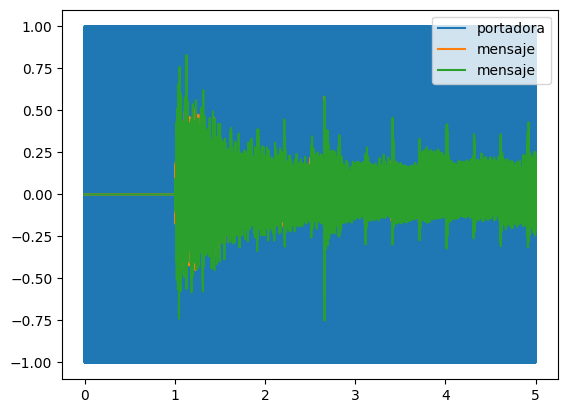

In [11]:
xpro = x.copy() #copiar archivos para procesar
xs = xpro[int(ti):int(tf*Fmuestreo),:]
#xc1 = xs[:,0]
#xc2 = xs[:,1]
c = np.cos(2*np.pi*Fc*t)
plt.plot(t,c,label='portadora')
plt.plot(t,xs,label='mensaje')
#plt.plot(t,xc1,label='mensaje channel 1')
#plt.plot(t,xc2,label='mensaje channel 2')
plt.legend()
plt.show()

Asi ya graficamos en el tiempo, para graficar en la frecuencia debemos aplicar FFT:

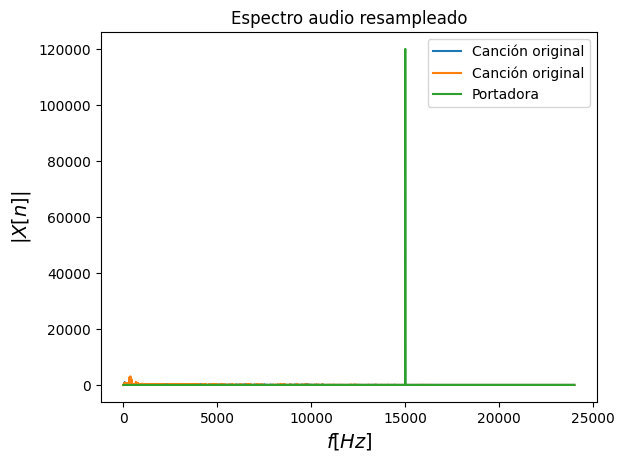

In [12]:
Xw = np.fft.rfft(xs,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
vf = np.fft.rfftfreq(np.size(xs,0),1/Fmuestreo) #se crea el vector de frecuencias
cw = np.fft.rfft(c, axis=0)
vfc = np.fft.rfftfreq(np.size(c,0),1/Fmuestreo) #se crea el vector de frecuencias
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.legend()
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

Ya que no se ve el espectro de nuestra canción original, lo voy a pintar a parte:

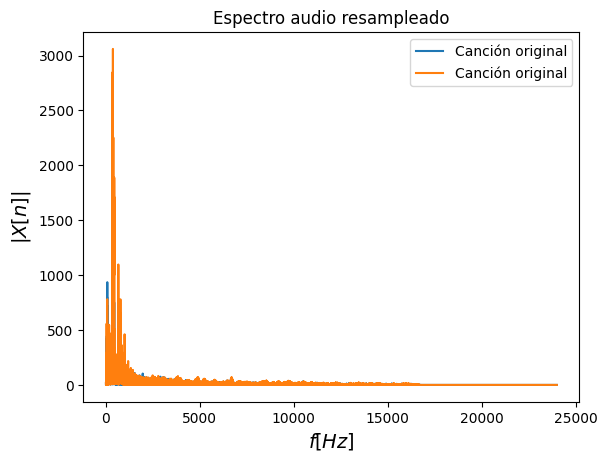

In [13]:
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.legend()
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

Y vemos que era de esperarse que no se viera nuestra canción, ya que tiene magnitudes de apenas $3000$, mientras la portadora llega a $10^9$

Ahora vamos a crear con base a estas 2 señales la señal "received DSB-CS signal"

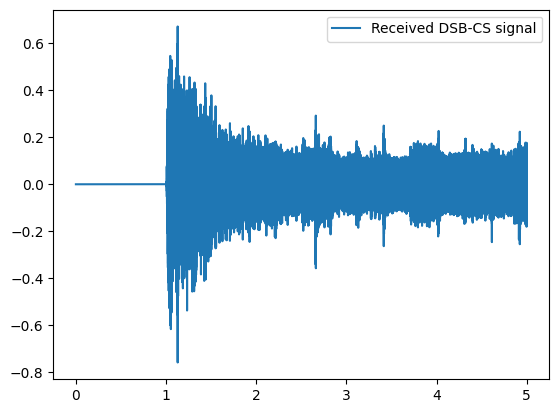

In [14]:
xs_mono = np.mean(xs, axis=1) #convertimos de stereo a mono para poder enviar el mensaje
#es la solución más simple, y la que usa AM tradicional, ya que sino tendriamos que o enviar 2 ondas una con cada canal o hacer un arreglo más complejo.
received = c*xs_mono
plt.plot(t,received,label='Received DSB-CS signal')
plt.legend()
plt.show()

En un principio parece que es la misma canción que al inicio, pero si la escuchamos:

In [15]:
ns = 5 #se reproducen los primeros ns segundos
Audio(received[:int(fs*ns)].T,rate=fs)

Es un pitido feo en el que apenas se escucha nuestra canción, el cambio es aún mas notorio al investigar la frecuencia:

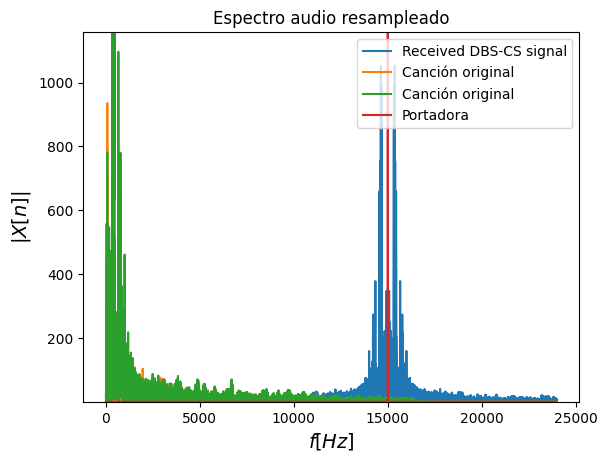

In [16]:
Xwr = np.fft.rfft(received,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
vfr = np.fft.rfftfreq(np.size(received,0),1/Fmuestreo) #se crea el vector de frecuencias
plt.plot(vfr,abs(Xwr), label='Received DBS-CS signal')#se grafica la magnitud
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.legend()
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.ylim([abs(Xwr).min(), 1.1*abs(Xwr).max()])
plt.show()

En este caso agregamos un limite a el eje y para que fuese más visible nuestro espectro. Tal como podemos apreciar si hay diferencia entre la canción original, la portadora y la "received DBS-CS signal". Ahora continuamos con la siguiente parte del proceso.

Luego de recibir esta señal, está pasa por el mixer y se convierte en:

$
\begin{equation}
A_1 m(t) cos^2 (2* \pi *f_0 *t)
\end{equation}
$

Vamos a simular ese proceso:

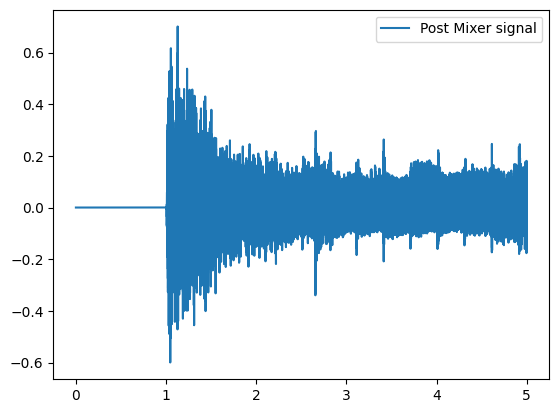

In [17]:
mixer = received * np.cos(2*np.pi*Fc*t)
plt.plot(t,mixer,label='Post Mixer signal')
plt.legend()
plt.show()

In [18]:
ns = 5 #se reproducen los primeros ns segundos
Audio(mixer[:int(fs*ns)].T,rate=fs)

Nuevamente vamos a investigar su frecuencia para ver que pasa:

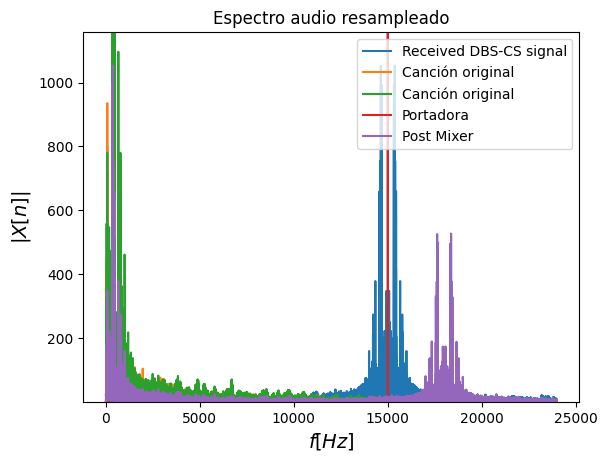

In [19]:
Xwmx = np.fft.rfft(mixer,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
vfmx = np.fft.rfftfreq(np.size(mixer,0),1/Fmuestreo) #se crea el vector de frecuencias
plt.plot(vfr,abs(Xwr), label='Received DBS-CS signal')#se grafica la magnitud
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.plot(vfmx,abs(Xwmx), label='Post Mixer')#se grafica la magnitud
plt.legend(loc='upper right') #a partir de aqui hay que especificar que coloque la leyenda en la parte
#superior derecha, ya que si no la muestra en el centro de la gráfica
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.ylim([abs(Xw).min(), 1.1*abs(Xwmx).max()])
plt.show()

En esta gráfica del espectroes posible ver que luego de pasar por el mixer quedan 2 espectros principales, si hicieramos la gráfica sin el valor absoluto posiblemente nos mostraria 3, ya que quedo el mensaje original, multiplicado por un escalar y sumado a una señal de una frecuencia aún mayor, lo que es:

$
\begin{equation}
\frac{A_1 m(t)}{2} + \frac{A_1 m(t)}{2}cos(4 \pi f_0 t)
\end{equation}
$

Ahora tenemos que implementar un filtro pasa bajas que solo deje pasar a nuestro mensaje multiplicado por un escalar $\frac{A_1}{2}$, para este fin reciclaremos un código usado durante el Taller 2:

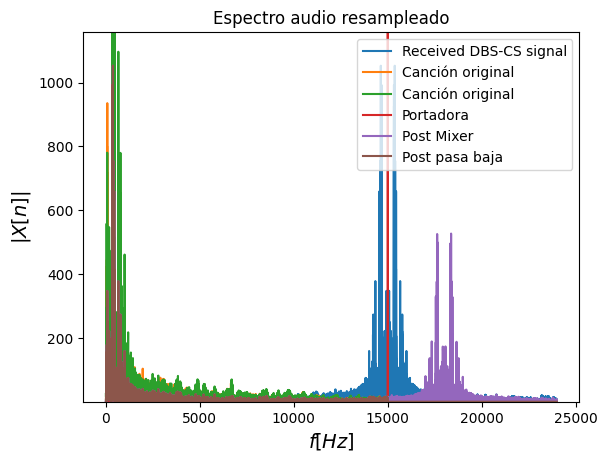

In [20]:
#filtrar espectro
Xwpb = Xwmx.copy() #copiamos el post mixer a un Xwpb
f1 = 0 #frecuencia en Hz corte 1 frecuencia min
f2 = 15000 #frecuencia en Hz corte 2 frecuencia max, coloque 15000 pues luego del mixer lo unico que queda es el mensaje original multiplicada por un escalar sumado al mensaje original modulado a una frecuencia aun más alta que los originales 15000 Hz de la onda que se uso como carry, y esa onda modulada a más alta frecuencia es el ruido que se escucha
#Normalmente se usa una frecuencia de corte ligeramente mayor a la frecuencia máxima de mi canción, por ejemplo, (fs/2)*1.1, pero en esta ocasión no es posible ya que si implementamos un filtro pasa bajas a dicha frecuencia seguiriamos escuchando el ruido según lo que podemos ver en la gráfica, por esa la modulación AM se realiza a una frecuencia mucho más alta que la del mensaje, en este caso con el filtro implementado se pierden agudos pero no se va a escuchar el ruido.
#El escalar no va a afectar a nuestra frecuencia
ind = ~((vf > f1) & (vf < f2)) #frecuencias eliminar-> recueder que ~ actua como negación
Xwpb[ind] = 0
plt.plot(vfr,abs(Xwr), label='Received DBS-CS signal')#se grafica la magnitud
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.plot(vfmx,abs(Xwmx), label='Post Mixer')#se grafica la magnitud
plt.plot(vf,abs(Xwpb), label='Post pasa baja')
plt.legend(loc='upper right')
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.ylim([abs(Xw).min(), 1.1*abs(Xwpb).max()])
plt.show()

In [21]:
xpb = np.fft.irfft(Xwpb,axis=0) #fft inversa
Audio(xpb[:int(fs*ns)].T,rate=fs)#reproducir señal filtrada y resampleada

Lo que gráficamente luce:

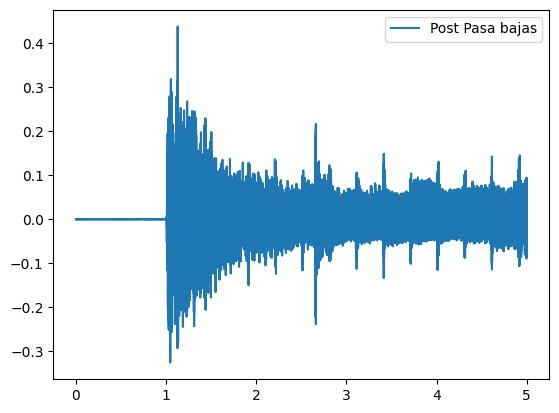

In [22]:
plt.plot(t,xpb,label='Post Pasa bajas')
plt.legend()
plt.show()

Esta es practicamente nuestra canción original, se supone que solo ha sido multiplicada por un escalar $\frac{A_1}{2}$, asi que volvemos pasamos a la etapa de *"Scale amplitude"*, donde multplicamos por $\frac{2}{A_1}$:

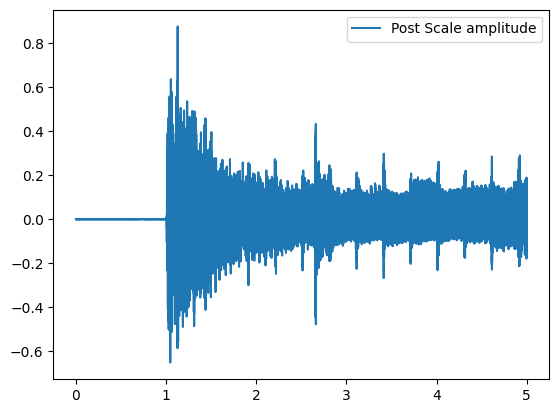

In [23]:
xsa = xpb*2 #x scale amplitude es igual a x pasa bajas por 2 sobre la amplitud de la portadora
plt.plot(t,xsa,label='Post Scale amplitude')
plt.legend()
plt.show()

Si lo comparamos con la canción original, veremos que es el mismo mensaje inicial, con las mismas amplitudes, solo que en Mono y no en Stereo, si queremos lo podemos ver en el dominio de la frecuencia:

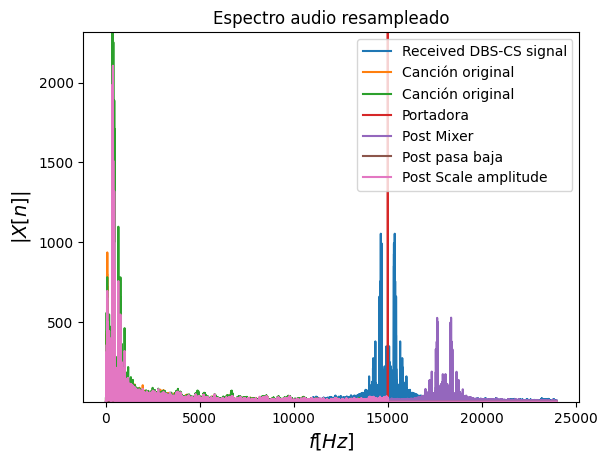

In [24]:
Xwsa = np.fft.rfft(xsa,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
vfsa = np.fft.rfftfreq(np.size(xsa,0),1/Fmuestreo) #se crea el vector de frecuencias
plt.plot(vfr,abs(Xwr), label='Received DBS-CS signal')#se grafica la magnitud
plt.plot(vf,abs(Xw), label='Canción original')#se grafica la magnitud
plt.plot(vfc,abs(cw), label='Portadora')#se grafica la magnitud
plt.plot(vfmx,abs(Xwmx), label='Post Mixer')#se grafica la magnitud
plt.plot(vf,abs(Xwpb), label='Post pasa baja')
plt.plot(vfsa,abs(Xwsa), label='Post Scale amplitude')#se grafica la magnitud
plt.legend(loc='upper right') #a partir de aqui hay que especificar que coloque la leyenda en la parte
#superior derecha, ya que si no la muestra en el centro de la gráfica
plt.title(r'Espectro audio resampleado')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.ylim([abs(Xw).min(), 1.1*abs(Xwsa).max()])
plt.show()

Finalmente escuchamos devuelta nuestra canción original en mono:

In [25]:
Audio(xsa[:int(fs*ns)].T,rate=fs)#reproducir señal filtrada y resampleada

#Pregunta 2:
Encuentre la función de transferencia que caracteriza el sistema masa, resorte, amortiguador, presentado en la siguiente Figura (asuma condiciones iniciales cero):

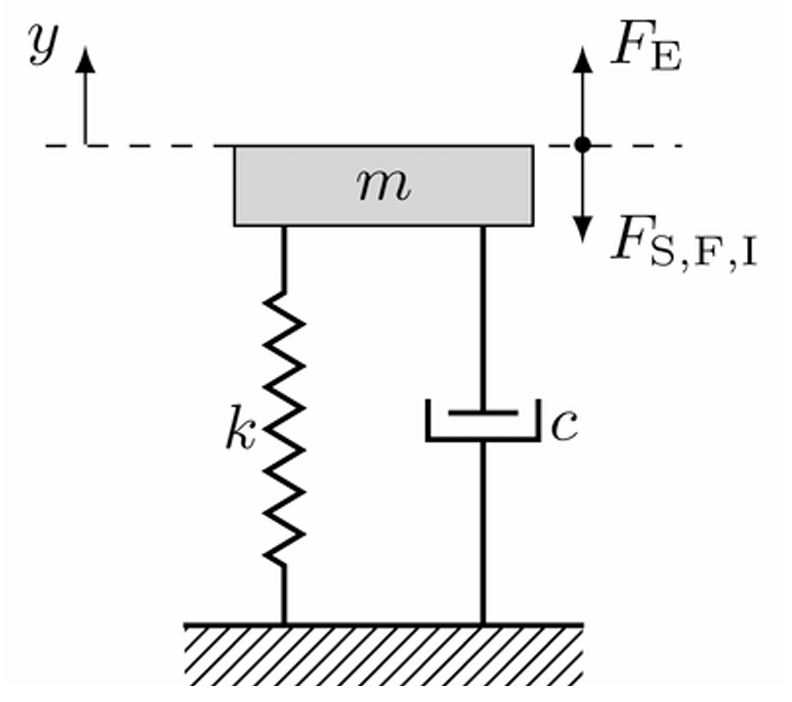

Posteriormente, encuentre el sistema equivalente del modelo masa, resorte, amortiguador, a partir del siguiente circuito eléctrico:
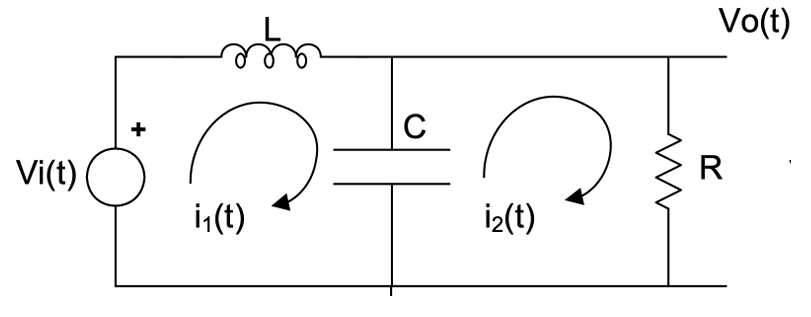

Finalmente proponga unos valores de $m$, $k$ y $c$ y sus equivalentes $R$, $L$ y $C$, para simular un sistema subamortiguado, sobreamortiguado y de amortiguamiento crítico (determine el factor de amortiguamiento, la frecuencia natural amortiguada, la frecuencia natural no amortiguada, el tiempo pico, tiempo de levantamiento y el tiempo de establecimiento en cada caso). Para cada caso, grafique el diagrama de polos y ceros, el diagrama de Bode, la respuesta impulso, respuesta escalón y respuesta rampa. Repita el proceso para modo lazo cerrado.

###R=/
Lo primero que nos piden es hallar la función de transferencia que caracteriza el sistema masa, resorte, amortiguador.

Según lo aprendido en el cuaderno de Pendulo Elástico las propiedades mecánicas del péndulo elástico amortiguado se analizan utilizando la teoria de los SLIT y su configuración mecánica es;

- Un cuerpo rigido de masa $m$ montado sobre un resorte de rigidez $k$.
- Un amortiguador con coeficiente de amortiguamiento $c$ paralelo al resorte para modelar la fricción del sistema
- Se asume que el movimiento de la masa a lo largo del tiempo se restringe al eje vertical y.
- La masa no se mueve para $t<0$.
- Condiciones iniciales $y(t)=0$ y $\frac{dy(t)}{dt} =0$ para $t<0$

##Ecuación diferencial:

La ecuación diferencial del sistema mecánico se obtiene al considerar el equilibrio de fuerzas ejercidas sobre la masa:

\begin{equation}
F_E(t) = F_S(t) + F_F(t) + F_I(t)
\end{equation}

Donde $F_E(t)$ denota una fuerza externa que actua sobre la masa.

La fuerza $F_S(t)$ inducida por el resorte esta dada por la ley de Hooke:

\begin{equation}
F_S(t)=ky(t)
\end{equation}

Este $y(t)$  es el desplazamiento de la masa con respecto al tiempo.

La fuerza de fricción $F_F(t)$ inducida por el amortiguador se modela de manera proporcional a la velocidad de la masa:

Si $y(t)$ es el desplazamiento en función del tiempo, la velocidad es su primera derivada $\frac{dy(t)}{dt}$ con lo cual nos queda:

\begin{equation}
F_F(t)= c\frac{dy(t)}{dt}
\end{equation}

Ahora solo falta la fuerza de inercia $F_I$ que debida a la aceleración se la masa se modela como:

\begin{equation}
F_I(t)=m\frac{d^2y(t)}{dt^2}
\end{equation}

Ya que la aceleración es la segunda derivada de la posición y la primera derivada de la velocidad.

Finalmente si despejamos esto en la expresión inicial obtenemos:

\begin{equation}
m\frac{d^2y(t)}{dt^2}+c\frac{dy(t)}{dt}+ky(t)=F_E(t)
\end{equation}

Esta es la ecuación diferencial que describe el desplazamiento del péndulo elastico amortiguado como consecuencia de la fuerza externa $F_E(t)$, que puede interpretarse como un SLIT para el cual $x(t)=F_E(t)$ es la señal de entrada y el desplazamiento de la masa $y(t)$ es la señal de salida.

Entonces la ecuación quedo:

\begin{equation}
m\frac{d^2y(t)}{dt^2}+c\frac{dy(t)}{dt}+ky(t)=x(t)
\end{equation}

Sabemos que la función de transferencia viene dada por:

\begin{equation}
H(s)=\frac{Y(s)}{X(s)}
\end{equation}

O también:

\begin{equation}
H(s)=\frac{Y(s)}{X(s)}=\frac{Σ^M_{m=0}a_ms^M}{Σ^N_{n=0} b_ns^N}
\end{equation}

En esta definición el $a_m$ es el coeficiente m-ésimo que acompañan a a la derivada número $m$, sabiendo que el SLIT puede también escribirse como:

\begin{equation}
\Sigma^M_{m=0}a_m\frac{d^m}{dt^m}x(t)=\Sigma^N_{n=0}b_n\frac{d^n}{dt^n}y(t)
\end{equation}

Lo que en nuestro caso luce como:

\begin{equation}
x(t)=ky(t)+c\frac{dy(t)}{dt}+m\frac{d^2y(t)}{dt^2}
\end{equation}

Con lo que resulta evidente que:

\begin{equation}
H(s)=\frac{Y(s)}{X(s)}=\frac{Σ^M_{m=0}a_ms^M}{Σ^N_{n=0} b_ns^N} = \frac{1s^0}{ks^0+cs^1+ms^2}
\end{equation}

O lo que es lo mismo:

\begin{equation}
H(s)=\frac{1}{k+cs+ms^2}
\end{equation}





Lo siguiente que se nos pide es hallar el sitema equivalente a partir de un circuito eléctrico. Para empezar hay que plantear ecuaciones para el circuito:

Analizando por nodos, si tomamos como tierra al nodo de abajo por costumbre, la ecuación del nodo $Vo(t)$ es:

\begin{equation}
i_R(t)+i_C(t)+i_L(t)=0
\end{equation}

La corriente en la resistencia es el elemento más sencillo de despejar, viene dado por $\frac{V}{R}$, y en este caso la tensión que pasa por la resistencia no es otra que la de salida $Vo(t)$, asi que queda:

\begin{equation}
i_R(t)=\frac{Vo(t)}{R}
\end{equation}

El siguiente elemento más sencillo es la corriente del condesador que viene dada por:

\begin{equation}
i_C(t)=C\frac{d}{dt}v_C(t)
\end{equation}

Donde $V_C(t)$ es la tensión en el condensador, y en este circuito resulta evidente que es $Vo(t)$, asi que queda:

\begin{equation}
i_C(t)=C\frac{d}{dt}Vo(t)
\end{equation}

Finalmente, se supone que la tensión en el inductor es:

\begin{equation}
v_L(t)=L\frac{d}{dt}i_L(t)
\end{equation}

Pero en este caso:

\begin{equation}
v_L(t)=Vo(t)-Vi(t)
\end{equation}

Luego:

\begin{equation}
Vo(t)-Vi(t)=L\frac{d}{dt}i_L(t)
\end{equation}

Aplicando algo de álgebra:

\begin{equation}
\frac{Vo(t)-Vi(t)}{L}=\frac{d}{dt}i_L(t)
\end{equation}

Si volvemos a la ecuación original y reemplazamos lo que ya teniamos:

\begin{equation}
i_R(t)+i_C(t)+i_L(t)=0
\end{equation}

\begin{equation}
\frac{Vo(t)}{R}+C\frac{d}{dt}Vo(t)+i_L(t)=0
\end{equation}

\begin{equation}
-\frac{Vo(t)}{R}-C\frac{d}{dt}Vo(t)=i_L(t)
\end{equation}

Si derivamos a ambos lados con respecto a t obtenemos:

\begin{equation}
-\frac{1}{R}\frac{d}{dt}Vo(t)-C\frac{d^2}{dt^2}Vo(t)=\frac{d}{dt}i_L(t)
\end{equation}




Pero $\frac{d}{dt}i_L(t)$ es:

\begin{equation}
\frac{Vo(t)-Vi(t)}{L}=\frac{d}{dt}i_L(t)
\end{equation}

Luego al reemplazar nos queda:

\begin{equation}
-\frac{1}{R}\frac{d}{dt}Vo(t)-C\frac{d^2}{dt^2}Vo(t)=\frac{Vo(t)-Vi(t)}{L}
\end{equation}

Hacemos algebra y finalmente la ecuación queda:
\begin{equation}
CL\frac{d^2}{dt^2}Vo(t)+\frac{L}{R}\frac{d}{dt}Vo(t)+Vo(t)=Vi(t)
\end{equation}



Para no restringir el valor de k solo a 1, multiplicamos toda la ecuación por $\frac{1}{L}$ y nos queda:

\begin{equation}
C\frac{d^2}{dt^2}Vo(t)+\frac{1}{R}\frac{d}{dt}Vo(t)+\frac{1}{L}Vo(t)=\frac{1}{L}Vi(t)
\end{equation}

Asi podemos decir que el modelo es equivalente si:

\begin{equation}
C = m
\end{equation}
\begin{equation}
\frac{1}{R} = c
\end{equation}
\begin{equation}
\frac{1}{L} = k
\end{equation}
\begin{equation}
\frac{1}{L}Vi(t) = x(t) = F_E(t)
\end{equation}

Con esto en mente, la función de transferencia del circuito queda:

\begin{equation}
H(s)=\frac{\frac{1}{L}}{\frac{1}{L}+\frac{1}{R}s+Cs^2}
\end{equation}

Lo siguiente que nos piden es dar valor a nuestras variables $R$, $L$, $C$, $m$, $c$ y $k$ para simular un sistema subamortiguado, sobreamortiguado, y de amortiguamiento critico, pero, para no ir dando valores al azar calcularemos el factor de amortiguamiento en ambos casos y daremos valores según nuestras necesidades.

El factor de amortiguamiento $ξ$ se calcula, teniendo una función de transferencia de la forma:

\begin{equation}
H(s)=\frac{1}{a_2s^2+a_1s+a_0}
\end{equation}

Como:

\begin{equation}
ξ=\frac{a_1}{2\sqrt{a_0a_2}}
\end{equation}

Lo primero que nos piden es un sistema subamortiguado, y según el cuaderno de Péndulo Elástico esto se da cuando el factor de amortiguamiento es:

\begin{equation}
0<ξ<1
\end{equation}

En este caso si $a_0=1$, $a_1=1$ y $a_2=1$ entonces:

\begin{equation}
ξ=\frac{1}{2\sqrt{1*1}}=\frac{1}{2}
\end{equation}

Y eso cumple con la condición, para esto $m=1$, $c=1$, $k=1$, $R=1$, $L=1$ y $C=1$.

##Sistema subamortiguado

Ya vimos que para este caso

\begin{equation}
ξ=\frac{1}{2}
\end{equation}

Por su parte la frecuencia natural no amortiguada se calcula como:

\begin{equation}
ω_n=\sqrt{\frac{a_0}{a_2}}=\sqrt{\frac{1}{1}}=1
\end{equation}

Mientras que la frecuencia natural amortiguada es:

\begin{equation}
ω_d=\omega_n \sqrt{1-ξ^2}=1*\sqrt{1-0,5^2}=\sqrt{0,75}≈0,866
\end{equation}

El tiempo pico es:

\begin{equation}
t_p=\frac{π}{ω_n\sqrt{1-ξ^2}}=\frac{π}{1\sqrt{1-0,5^2}}≈3,628
\end{equation}

Y finalmente el tiempo de establecimiento es:

\begin{equation}
t_s=\frac{3}{ξω_n}=\frac{3}{0,5*1}=6
\end{equation}

Ahora nos piden graficar los polos y ceros, para esto tenemos que hallar las raices de nuestra función de transferencia:

\begin{equation}
H(s)=\frac{1}{s^2+s+1}
\end{equation}

Como en el numerador no hay raices nuestra función no tiene ceros, para hallar los polos usamos numpy:

In [26]:
import numpy as np

coef = [1, 1, 1]   # s^2 + s + 1
raices = np.roots(coef)
print(raices)

[-0.5+0.8660254j -0.5-0.8660254j]


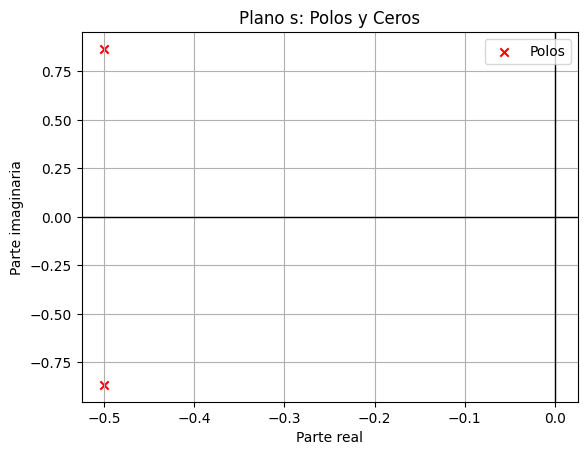

In [27]:
import matplotlib.pyplot as plt
plt.scatter(np.real(raices), np.imag(raices), marker='x', color='r', label='Polos')
plt.axhline(0, color='black', linewidth=1) #ponemos los ejes para que se vea mejor
plt.axvline(0, color='black', linewidth=1)
plt.xlabel('Parte real')
plt.ylabel('Parte imaginaria')
plt.title('Plano s: Polos y Ceros')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

Ahora vamos a hacer el diagrama de bode, para ello reemplazamos $s$ por $jw$ en la función de transferencia y obtenemos:

\begin{equation}
H(w)=\frac{1}{(jw)^2+jw+1}=\frac{1}{-w^2+jw+1}
\end{equation}

Ahora graficamos:

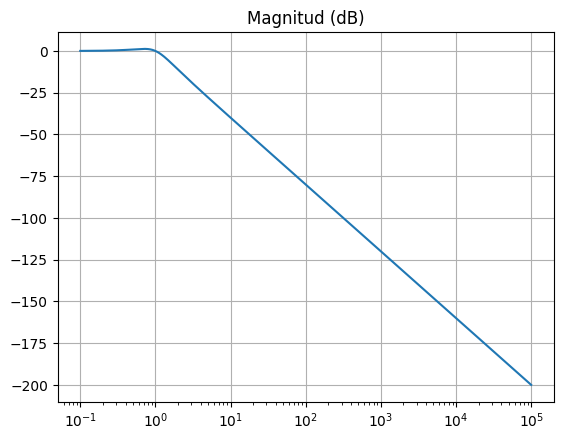

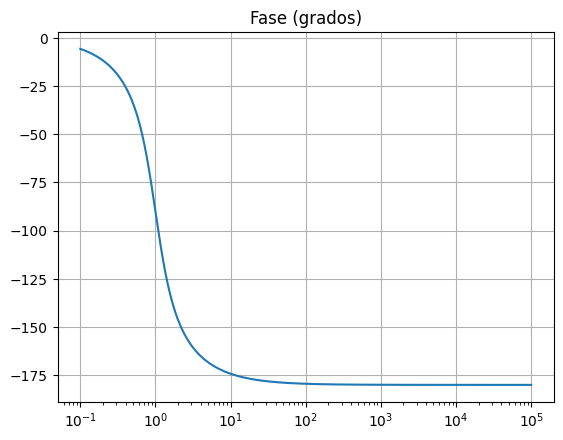

In [28]:
def H(w, m, c, k):
  return 1/(-(m*(w**2))+(1j*c*w)+k) #creamos nuestra función de transferencia
w = np.logspace(-1,5,2000) #generamos un vector con valores igualmente espaciados en escala logaritmica
Heval = H(w, 1, 1, 1) #evaluamos la función de transferencia en el vector w
Hmag = 20*np.log10(np.abs(Heval)) #magnitud de H en dB
Hphase = np.angle(Heval, deg=True) #fase de H
plt.figure()
plt.semilogx(w, Hmag) #hace gráfico con eje x logaritmico
plt.grid(True)
plt.title("Magnitud (dB)")

plt.figure()
plt.semilogx(w, Hphase)
plt.grid(True)
plt.title("Fase (grados)")
plt.show()

Ahora tenemos que graficar la respuesta impulso. Para eso tenemos que solucionar la EDO, y usaremos Sympy para ello:

In [29]:
%matplotlib inline
import sympy as sym
sym.init_printing()

t, m, c, k = sym.symbols('t m c k', real=True)
x = sym.Function('x')(t)
y = sym.Function('y')(t)

ode = sym.Eq(m*y.diff(t, 2) + c*y.diff(t) + k*y, x)
ode

                         2              
  d                     d               
c⋅──(y(t)) + k⋅y(t) + m⋅───(y(t)) = x(t)
  dt                      2             
                        dt              

In [30]:
solution_h = sym.dsolve(ode.subs(x, sym.DiracDelta(t)).subs(y, sym.Function('h')(t)))
solution_h

                                                                         ⎛     ↪
             ⎛        ____________⎞          ⎛       ____________⎞       ⎜     ↪
             ⎜       ╱  2         ⎟          ⎜      ╱  2         ⎟     t⋅⎝-c + ↪
           t⋅⎝-c + ╲╱  c  - 4⋅k⋅m ⎠       -t⋅⎝c + ╲╱  c  - 4⋅k⋅m ⎠     ─────── ↪
           ────────────────────────       ─────────────────────────            ↪
                     2⋅m                             2⋅m              ℯ        ↪
h(t) = C₁⋅ℯ                         + C₂⋅ℯ                          + ──────── ↪
                                                                               ↪
                                                                               ↪
                                                                             ╲ ↪

↪     ____________⎞            ⎛       ____________⎞      
↪    ╱  2         ⎟            ⎜      ╱  2         ⎟      
↪  ╲╱  c  - 4⋅k⋅m ⎠         -t⋅⎝c + ╲╱  c  - 4⋅k⋅m ⎠      
↪ ──────────

Determinamos constantes de integración $C1$ y $C2$ a partir de condiciones iniciales $y(t)=0$ y $\frac{dy(t)}{dt}=0$ para $t<0$

In [31]:
integration_constants = sym.solve( (solution_h.rhs.limit(t, 0, '-'), solution_h.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

Se sustituye:

In [32]:
h = solution_h.subs(integration_constants)
h

          ⎛        ____________⎞            ⎛       ____________⎞      
          ⎜       ╱  2         ⎟            ⎜      ╱  2         ⎟      
        t⋅⎝-c + ╲╱  c  - 4⋅k⋅m ⎠         -t⋅⎝c + ╲╱  c  - 4⋅k⋅m ⎠      
        ────────────────────────         ─────────────────────────     
                  2⋅m                               2⋅m                
       ℯ                        ⋅θ(t)   ℯ                         ⋅θ(t)
h(t) = ────────────────────────────── - ───────────────────────────────
                 ____________                      ____________        
                ╱  2                              ╱  2                 
              ╲╱  c  - 4⋅k⋅m                    ╲╱  c  - 4⋅k⋅m         

Ahora guardamos los valores de $m$, $c$ y $k$ en un  diccionario para sustituir y graficar:

In [33]:
mck = {m: 1, c: sym.Rational('1'), k: sym.Rational('1')}
mck

{c: 1, k: 1, m: 1}

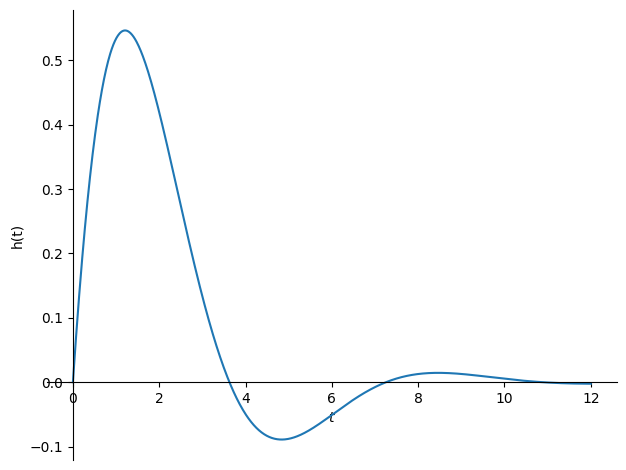

In [34]:
sym.plot(h.rhs.subs(mck), (t,0,12), ylabel=r'h(t)');

Ahora queremos graficar la respuesta escalón, para eso nuevamente resolvemos la EDO por Sympy:

In [35]:
solution_u = sym.dsolve(ode.subs(x, sym.Heaviside(t)).subs(y, sym.Function('y_{step}')(t)))
solution_u

                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                            

Constantes de integración:

In [36]:
integration_constants = sym.solve( (solution_u.rhs.limit(t, 0, '-'), solution_u.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [37]:
ys = solution_u.subs(integration_constants)
ys

                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                ⎛⎧⎧                                ____________                ↪
                ⎜⎪⎪        2⋅m                    ╱  2                         ↪
                ⎜⎪⎪─────────

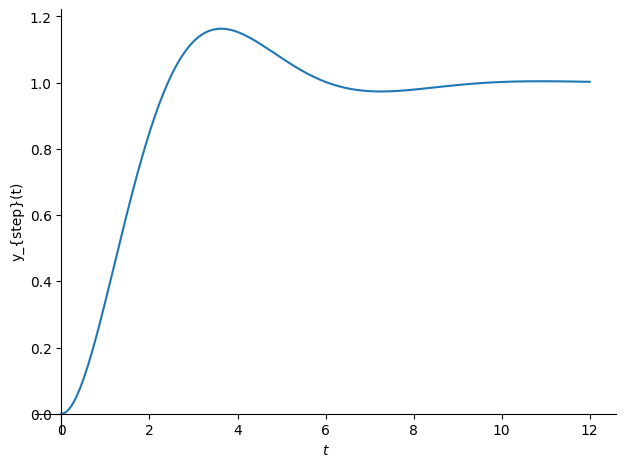

In [38]:
sym.plot(ys.rhs.subs(mck), (t,0,12), ylabel=r'y_{step}(t)');

Ahora la respuesta a la rampa:

In [39]:
solution_r = sym.dsolve(ode.subs(x, t*sym.Heaviside(t)).subs(y, sym.Function('y_{ramp}')(t))) #la rampa es una función lineal que empieza desde 0, por eso la definimos como t*escalon
solution_r

                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                                                                               ↪
                            

Constantes de integración:

In [40]:
yr= solution_r.rhs.subs(mck) #en esta ocasion haremos primero la sustitución ya que sino Sympy se pega
yr

                                                    -t⋅(1 + √3⋅ⅈ)   t   √3⋅ⅈ⋅t ↪
    -t⋅(1 - √3⋅ⅈ)        -t⋅(1 + √3⋅ⅈ)              ──────────────  ─ + ────── ↪
    ──────────────       ──────────────                   2         2     2    ↪
          2                    2          2⋅√3⋅ⅈ⋅t⋅ℯ              ⋅ℯ           ↪
C₁⋅ℯ               + C₂⋅ℯ               + ──────────────────────────────────── ↪
                                                        3⋅(1 + √3⋅ⅈ)           ↪

↪                   -t⋅(1 - √3⋅ⅈ)   t   √3⋅ⅈ⋅t                -t⋅(1 + √3⋅ⅈ)    ↪
↪                   ──────────────  ─ - ──────                ──────────────   ↪
↪                         2         2     2                         2          ↪
↪ ⋅θ(t)   2⋅√3⋅ⅈ⋅t⋅ℯ              ⋅ℯ          ⋅θ(t)   2⋅√3⋅ⅈ⋅ℯ              ⋅ℯ ↪
↪ ───── - ───────────────────────────────────────── - ──────────────────────── ↪
↪                       3⋅(1 - √3⋅ⅈ)                               3⋅(-1 + √3⋅ ↪

↪ t   √3⋅ⅈ⋅t              

In [41]:
integration_constants = sym.solve( (yr.limit(t, 0, '-'), yr.diff(t).limit(t, 0, '-')), ['C1', 'C2'] )
integration_constants

{C₁: 0, C₂: 0}

In [42]:
yrf = yr.subs(integration_constants)
yrf

          -t⋅(1 + √3⋅ⅈ)   t   √3⋅ⅈ⋅t                  -t⋅(1 - √3⋅ⅈ)   t   √3⋅ⅈ ↪
          ──────────────  ─ + ──────                  ──────────────  ─ - ──── ↪
                2         2     2                           2         2     2  ↪
2⋅√3⋅ⅈ⋅t⋅ℯ              ⋅ℯ          ⋅θ(t)   2⋅√3⋅ⅈ⋅t⋅ℯ              ⋅ℯ         ↪
───────────────────────────────────────── - ────────────────────────────────── ↪
              3⋅(1 + √3⋅ⅈ)                                3⋅(1 - √3⋅ⅈ)         ↪

↪ ⋅t                -t⋅(1 + √3⋅ⅈ)   t   √3⋅ⅈ⋅t                -t⋅(1 + √3⋅ⅈ)    ↪
↪ ──                ──────────────  ─ + ──────                ──────────────   ↪
↪                         2         2     2                         2          ↪
↪   ⋅θ(t)   2⋅√3⋅ⅈ⋅ℯ              ⋅ℯ          ⋅θ(t)   2⋅√3⋅ⅈ⋅ℯ              ⋅θ ↪
↪ ─────── - ─────────────────────────────────────── + ──────────────────────── ↪
↪                        3⋅(-1 + √3⋅ⅈ)                       3⋅(-1 + √3⋅ⅈ)     ↪

↪               -t⋅(1 - √3

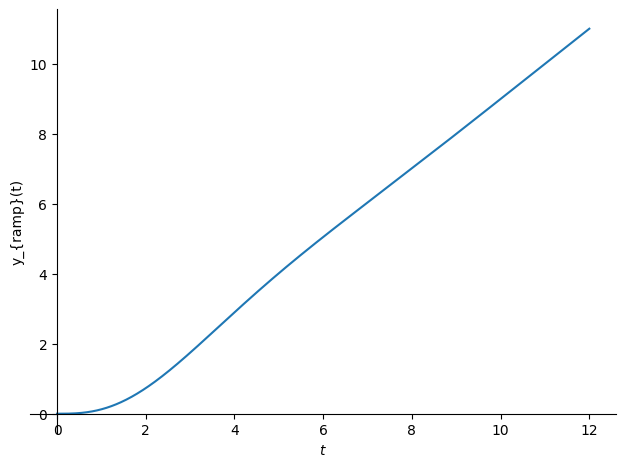

In [43]:
sym.plot(yrf, (t,0,12), ylabel=r'y_{ramp}(t)');

###Sistema sobreamortiguado

Ya explicamos antes que para un buen método para buscar que un sistema cumpla con lo que queremos es por el factor de amortiguamiento $ξ$ que viene dado por:

\begin{equation}
ξ=\frac{a_1}{2\sqrt{a_0a_2}}
\end{equation}

Con:

\begin{equation}
H(s)=\frac{1}{a_2s^2+a_1s+a_0}
\end{equation}

Para que el sistema sea sobreamortiguado debe cumplirse que $ξ>1$, con esto en mente podemos elegir $a_2=1$, $a_1=3$ y $a_0=1$, con lo que el factor de amortiguamiento será:

\begin{equation}
ξ=\frac{a_1}{2\sqrt{a_0a_2}}=\frac{3}{2\sqrt{1*1}}=\frac{3}{2}
\end{equation}

Esto cumple con lo solicitado, asi $m=1$, $c=3$, $k=1$ y sus equivalentes en el circuito serán $L=1$, $R=\frac{1}{3}$ y $C=1$

Una vez con el factor de amortiguamiento claro, la frecuencia natural no amortiguada es:

\begin{equation}
ω_n=\sqrt{\frac{a_0}{a_2}}=\sqrt{\frac{1}{1}}=1
\end{equation}

Mientras la frecuencia natural amortiguada es:

\begin{equation}
ω_d=ω_n\sqrt{1-ξ^2}=1*\sqrt{1-\left(\frac{3}{2}\right)^2} ≈ j1,118
\end{equation}

Por su parte el tiempo pico es:

\begin{equation}
t_p=\frac{π}{ω_n\sqrt{1-ξ^2}}=\frac{π}{1*\sqrt{1-\left(\frac{3}{2}\right)^2}} ≈ -j2,81
\end{equation}

Y el tiempo de establecimiento es:

\begin{equation}
t_s=\frac{3}{ξω_n}=\frac{3}{\frac{3}{2}*1}=2
\end{equation}


Ahora vamos a graficar los polos y ceros. Para eso hallamos las raices de la ecuación de transferencia:

\begin{equation}
H(s)=\frac{1}{s^2+3s+1}
\end{equation}



In [44]:
import numpy as np

coef = [1, 3, 1]   # s^2 + 3s + 1
raices = np.roots(coef)
print(raices)

[-2.61803399 -0.38196601]


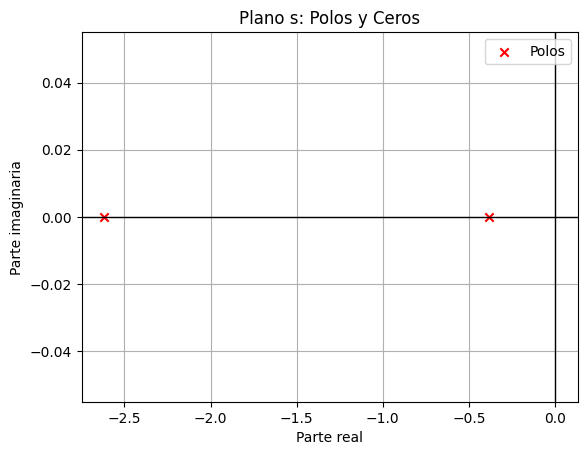

In [45]:
import matplotlib.pyplot as plt
plt.scatter(np.real(raices), np.imag(raices), marker='x', color='r', label='Polos')
plt.axhline(0, color='black', linewidth=1) #ponemos los ejes para que se vea mejor
plt.axvline(0, color='black', linewidth=1)
plt.xlabel('Parte real')
plt.ylabel('Parte imaginaria')
plt.title('Plano s: Polos y Ceros')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

Ahora para el diagrama de bode reemplazamos $s$ por $jw$ en la función de transferencia:

\begin{equation}
H(w)=\frac{1}{(jw)^2+3(jw)+1}=\frac{1}{-w^2+j3w+1}
\end{equation}

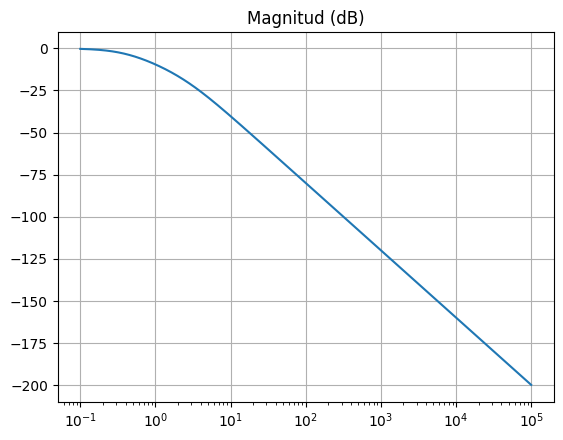

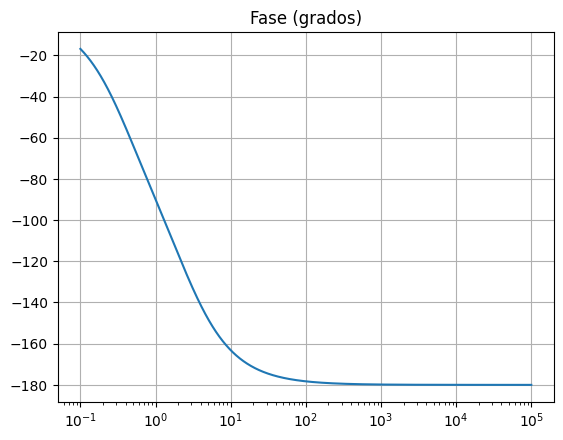

In [46]:
Heval = H(w, 1, 3, 1) #evaluamos la función de transferencia en el vector w
Hmag = 20*np.log10(np.abs(Heval)) #magnitud de H en dB
Hphase = np.angle(Heval, deg=True) #fase de H
plt.figure()
plt.semilogx(w, Hmag) #hace gráfico con eje x logaritmico
plt.grid(True)
plt.title("Magnitud (dB)")

plt.figure()
plt.semilogx(w, Hphase)
plt.grid(True)
plt.title("Fase (grados)")
plt.show()

Ahora graficamos respuesta impulso con la EDO que ya habiamos solucionado antes:

In [47]:
mck = {m: 1, c: sym.Rational('3'), k: sym.Rational('1')}
mck

{c: 3, k: 1, m: 1}

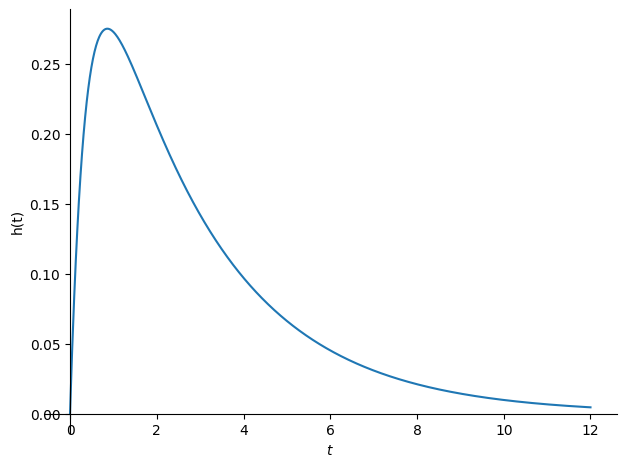

In [48]:
sym.plot(h.rhs.subs(mck), (t,0,12), ylabel=r'h(t)');

Respuesta escalon:

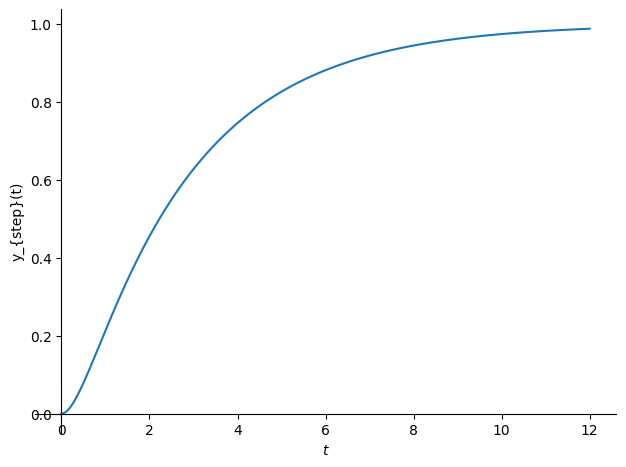

In [49]:
sym.plot(ys.rhs.subs(mck), (t,0,12), ylabel=r'y_{step}(t)');

Respuesta rampa:

In [50]:
yr= solution_r.rhs.subs(mck) #en esta ocasion haremos primero la sustitución ya que sino Sympy se pega
yr

                                              -t⋅(√5 + 3)   √5⋅t   3⋅t         ↪
    -t⋅(3 - √5)        -t⋅(√5 + 3)            ────────────  ──── + ───         ↪
    ────────────       ────────────                2         2      2          ↪
         2                  2         2⋅√5⋅t⋅ℯ            ⋅ℯ          ⋅θ(t)    ↪
C₁⋅ℯ             + C₂⋅ℯ             - ───────────────────────────────────── +  ↪
                                                   5⋅(√5 + 3)                  ↪

↪         -t⋅(3 - √5)     √5⋅t   3⋅t              -t⋅(√5 + 3)   √5⋅t   3⋅t     ↪
↪         ────────────  - ──── + ───              ────────────  ──── + ───     ↪
↪              2           2      2                    2         2      2      ↪
↪ 2⋅√5⋅t⋅ℯ            ⋅ℯ            ⋅θ(t)   2⋅√5⋅ℯ            ⋅ℯ          ⋅θ(t ↪
↪ ─────────────────────────────────────── + ────────────────────────────────── ↪
↪               5⋅(3 - √5)                             5⋅(3⋅√5 + 7)            ↪

↪           -t⋅(√5 + 3)   

In [51]:
integration_constants = sym.solve( (yr.limit(t, 0, '-'), yr.diff(t).limit(t, 0, '-')), ['C1', 'C2'] )
integration_constants

{C₁: 0, C₂: 0}

In [52]:
yrf = yr.subs(integration_constants)
yrf

          -t⋅(√5 + 3)   √5⋅t   3⋅t                -t⋅(3 - √5)     √5⋅t   3⋅t   ↪
          ────────────  ──── + ───                ────────────  - ──── + ───   ↪
               2         2      2                      2           2      2    ↪
  2⋅√5⋅t⋅ℯ            ⋅ℯ          ⋅θ(t)   2⋅√5⋅t⋅ℯ            ⋅ℯ            ⋅θ ↪
- ───────────────────────────────────── + ──────────────────────────────────── ↪
               5⋅(√5 + 3)                               5⋅(3 - √5)             ↪

↪             -t⋅(√5 + 3)   √5⋅t   3⋅t              -t⋅(√5 + 3)                ↪
↪             ────────────  ──── + ───              ────────────               ↪
↪                  2         2      2                    2                     ↪
↪ (t)   2⋅√5⋅ℯ            ⋅ℯ          ⋅θ(t)   2⋅√5⋅ℯ            ⋅θ(t)   2⋅√5⋅ℯ ↪
↪ ─── + ─────────────────────────────────── - ─────────────────────── + ────── ↪
↪                  5⋅(3⋅√5 + 7)                    5⋅(3⋅√5 + 7)                ↪

↪ -t⋅(3 - √5)     √5⋅t   3

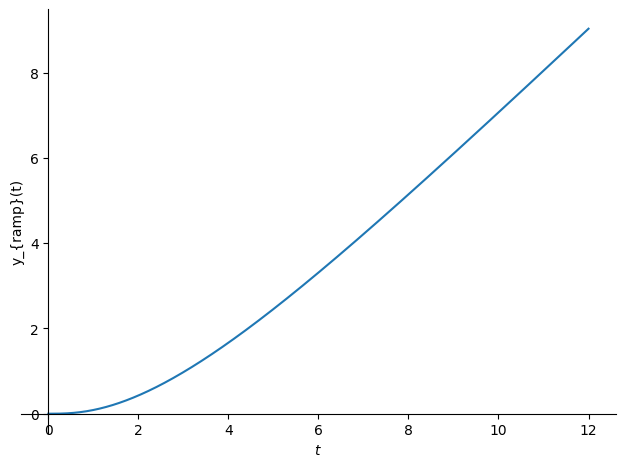

In [53]:
sym.plot(yrf, (t,0,12), ylabel=r'y_{ramp}(t)');

###Sistema con amortiguamiento critico

Ya hemos dicho antes que un buen método para saber que amortiguamiento tiene un sistema es por medio de su factor de amortiguamiento $ξ$, para que un sistema tenga amortiguamiento critico debe cumplirse que:

\begin{equation}
ξ=1
\end{equation}

Y $ξ$ se calcula como:

\begin{equation}
ξ=\frac{a_1}{2\sqrt{a_0a_2}}
\end{equation}

Con esto en mente proponemos los valores:

\begin{equation}
a_2=m=C=1
\end{equation}

\begin{equation}
a_1=c=\frac{1}{R}=2
\end{equation}

\begin{equation}
a_0=k=\frac{1}{L}=1
\end{equation}

Asi el factor de amortiguamiento es:

\begin{equation}
ξ=\frac{2}{2\sqrt{1*1}}=1
\end{equation}

La frecuencia natural no amortiguada es:

\begin{equation}
ω_n=\sqrt{\frac{1}{1}}=1
\end{equation}

La frecuencia natural amortiguada es:

\begin{equation}
ω_d=1*\sqrt{1-1^2}=0
\end{equation}

El tiempo pico es:

\begin{equation}
t_p=\frac{π}{1*\sqrt{1-1^2}}=∞
\end{equation}

Y el tiempo de establecimiento es:

\begin{equation}
t_s=\frac{3}{1*1}=3
\end{equation}




Ahora graficamos los polos y los ceros, asi que buscamos las raices de la función de transferencia:

\begin{equation}
H(s)=\frac{1}{s^2+2s+1}
\end{equation}

In [54]:
import numpy as np

coef = [1, 2, 1]   # s^2 + 2s + 1
raices = np.roots(coef)
print(raices)

[-1. -1.]


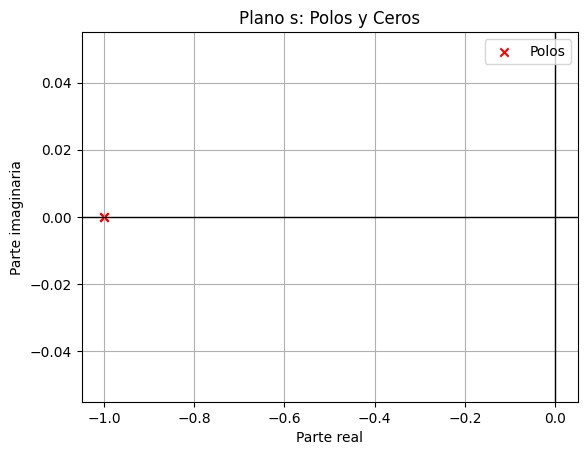

In [55]:
import matplotlib.pyplot as plt
plt.scatter(np.real(raices), np.imag(raices), marker='x', color='r', label='Polos')
plt.axhline(0, color='black', linewidth=1) #ponemos los ejes para que se vea mejor
plt.axvline(0, color='black', linewidth=1)
plt.xlabel('Parte real')
plt.ylabel('Parte imaginaria')
plt.title('Plano s: Polos y Ceros')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

Diagrama de bode:

\begin{equation}
H(w)=\frac{1}{(jw)^2+j2w+1}=\frac{1}{-w^2+j2w+1}
\end{equation}

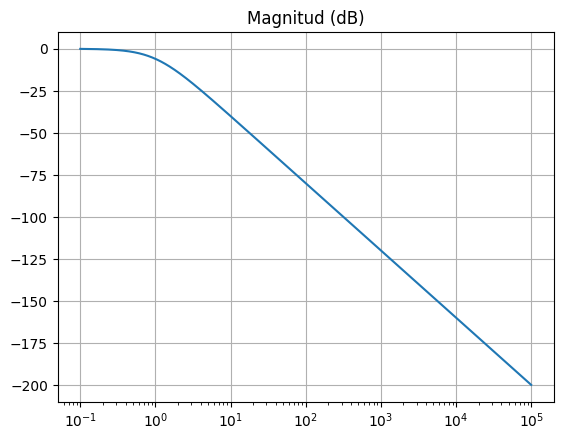

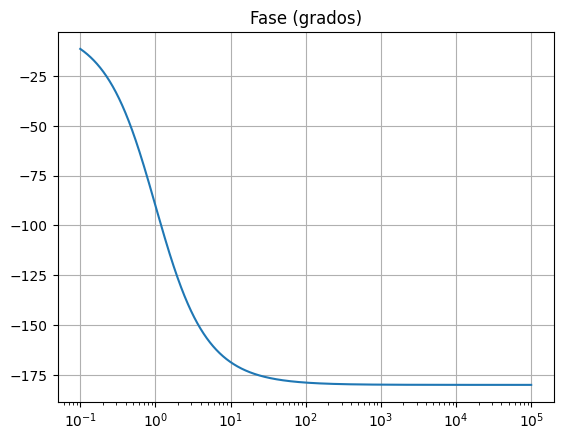

In [56]:
Heval = H(w, 1, 2, 1) #evaluamos la función de transferencia en el vector w
Hmag = 20*np.log10(np.abs(Heval)) #magnitud de H en dB
Hphase = np.angle(Heval, deg=True) #fase de H
plt.figure()
plt.semilogx(w, Hmag) #hace gráfico con eje x logaritmico
plt.grid(True)
plt.title("Magnitud (dB)")

plt.figure()
plt.semilogx(w, Hphase)
plt.grid(True)
plt.title("Fase (grados)")
plt.show()

Respuesta impulso:

In [57]:
mck = {m: 1, c: sym.Rational('2'), k: sym.Rational('1')}
mck

{c: 2, k: 1, m: 1}

In [58]:
odec= ode.subs(mck) #en esta ocasion haremos primero la sustitución ya que sino Sympy se indetermina, usamos solo .subs ya que los parametros no estan a la derecha sino a la izquierda y con eso bastara para que reemplace en toda la ecuacion
odec

                     2              
         d          d               
y(t) + 2⋅──(y(t)) + ───(y(t)) = x(t)
         dt           2             
                    dt              

In [59]:
solution_h = sym.dsolve(odec.subs(x, sym.DiracDelta(t)).subs(y, sym.Function('h')(t)))
solution_h

                             -t
h(t) = (C₁ + t⋅(C₂ + θ(t)))⋅ℯ  

In [60]:
integration_constants = sym.solve( (solution_h.rhs.limit(t, 0, '-'), solution_h.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [61]:
h = solution_h.subs(integration_constants)
h

          -t     
h(t) = t⋅ℯ  ⋅θ(t)

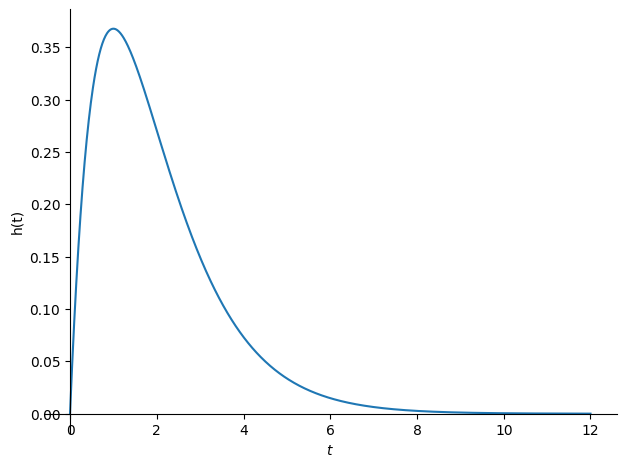

In [62]:
sym.plot(h.rhs, (t,0,12), ylabel=r'h(t)');

Respuesta escalón:

In [63]:
solution_u = sym.dsolve(odec.subs(x, sym.Heaviside(t)).subs(y, sym.Function('y_{step}')(t))) #otra vez hay que volver a solucionar la edo con mck ya cambiados por que sino sympy se indetermina :(
solution_u

                                           -t       
y_{step}(t) = (C₁ + t⋅(C₂ - θ(t)) - θ(t))⋅ℯ   + θ(t)

In [64]:
integration_constants = sym.solve( (solution_u.rhs.limit(t, 0, '-'), solution_u.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [65]:
ys = solution_u.subs(integration_constants)
ys

                                -t       
y_{step}(t) = (-t⋅θ(t) - θ(t))⋅ℯ   + θ(t)

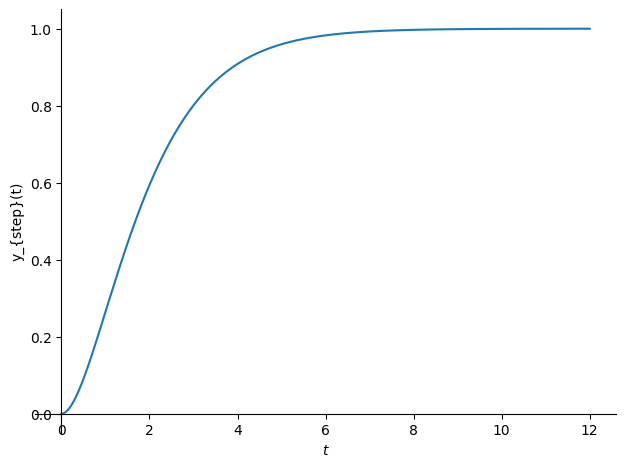

In [66]:
sym.plot(ys.rhs, (t,0,12), ylabel=r'y_{step}(t)');

Respuesta rampa:

In [67]:
solution_r = sym.dsolve(odec.subs(x, t*sym.Heaviside(t)).subs(y, sym.Function('y_{ramp}')(t))) #la rampa es una función lineal que empieza desde 0, por eso la definimos como t*escalon
solution_r #ya mejor soluciono desde la edoc por que no quiero probar si se indetermina

                                                      -t         
y_{ramp}(t) = t⋅θ(t) + (C₁ + t⋅(C₂ + θ(t)) + 2⋅θ(t))⋅ℯ   - 2⋅θ(t)

In [68]:
integration_constants = sym.solve( (solution_r.rhs.limit(t, 0, '-'), solution_r.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] )
integration_constants

{C₁: 0, C₂: 0}

In [69]:
yrf = solution_r.subs(integration_constants)
yrf

                                          -t         
y_{ramp}(t) = t⋅θ(t) + (t⋅θ(t) + 2⋅θ(t))⋅ℯ   - 2⋅θ(t)

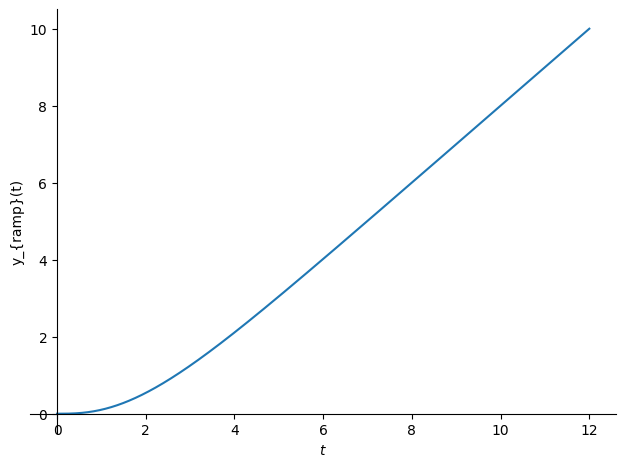

In [70]:
sym.plot(yrf.rhs, (t,0,12), ylabel=r'y_{ramp}(t)');

#Lazo Cerrado

En clase se nos explico que si la función de transferencia de un sistema en lazo abierto venia dada por:

\begin{equation}
H(s)=\frac{Y(s)}{X(s)}
\end{equation}

La función de transferencia de ese mismo sistema en lazo cerrado seria:

\begin{equation}
H_{LC}(s)=\frac{H(s)}{1+H(s)}
\end{equation}

Solucionando esto para nuestro sistema masa, resorte, amortiguador obtenemos:

\begin{equation}
H_{LC}(s)=\frac{\frac{1}{ms^2+cs+k}}{1+\frac{1}{ms^2+cs+k}} = \frac{1}{ms^2+cs+k+1}
\end{equation}

Como está ecuación sigue siendo de segundo orden aún es posible usar el factor de amortiguamiento como guia, que es lo que vamos a hacer:

###Sistema subamortiguado

El factor de amortiguamiento viene dado por:

\begin{equation}
ξ=\frac{a_1}{2\sqrt{a_0a_2}}
\end{equation}

Ahora $a_0=k+1$

Para que el sistema sea subamortiguado debe cumplirse que:

\begin{equation}
0<ξ<1
\end{equation}

Por simpleza diremos que:

\begin{equation}
a_2=m=C=1
\end{equation}

\begin{equation}
a_1=c=\frac{1}{R}=1
\end{equation}

\begin{equation}
a_0=k+1=\frac{1}{L}+1=2
\end{equation}

Luego el factor de amortiguamiento es:

\begin{equation}
ξ=\frac{1}{2\sqrt{1*2}}≈0.3536
\end{equation}

La frecuencia natural no amortiguada es:

\begin{equation}
ω_n=\sqrt{\frac{a_0}{a_2}}=\sqrt{\frac{2}{1}}≈1,414
\end{equation}

La frecuencia natural amortiguada es:

\begin{equation}
ω_d=1,414\sqrt{1-0,3536^2}≈1,323
\end{equation}

El tiempo pico es:

\begin{equation}
t_p=\frac{π}{1,323}≈2,375
\end{equation}

El tiempo de establecimiento es:

\begin{equation}
t_s=\frac{3}{0,3536*1,414}≈6
\end{equation}


Graficamos polos y ceros:

In [71]:
coef = [1, 1, 2]   # s^2 + s + 2
raices = np.roots(coef)
print(raices)

[-0.5+1.32287566j -0.5-1.32287566j]


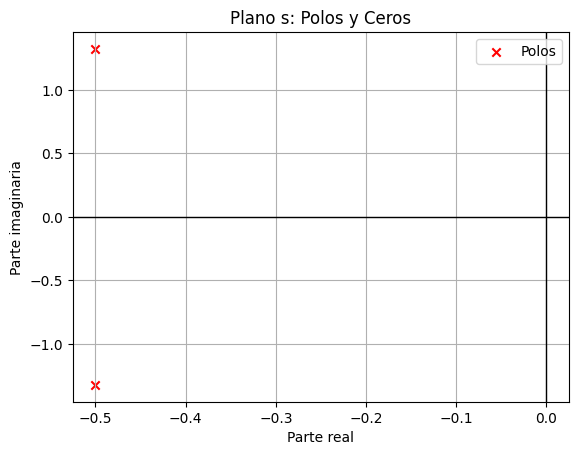

In [72]:
plt.scatter(np.real(raices), np.imag(raices), marker='x', color='r', label='Polos')
plt.axhline(0, color='black', linewidth=1) #ponemos los ejes para que se vea mejor
plt.axvline(0, color='black', linewidth=1)
plt.xlabel('Parte real')
plt.ylabel('Parte imaginaria')
plt.title('Plano s: Polos y Ceros')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

Diagrama de bode:

\begin{equation}
H(w)=\frac{1}{(jw)^2+jw+1+1}=\frac{1}{-w^2+jw+2}
\end{equation}


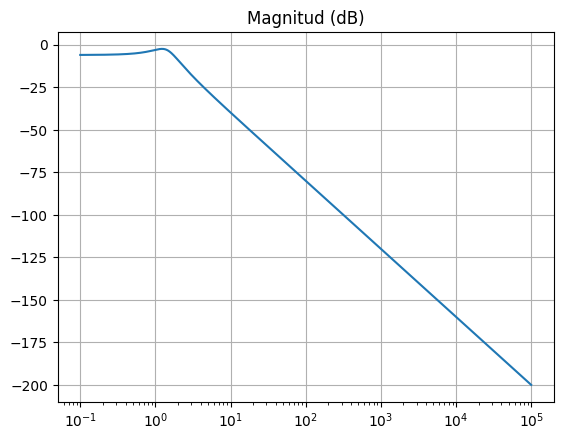

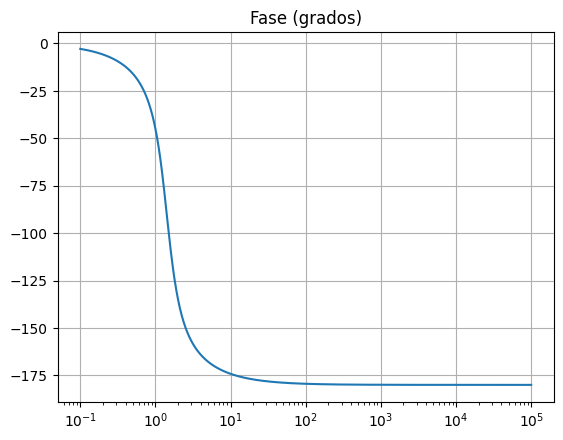

In [73]:
Heval = H(w, 1, 1, 2) #evaluamos la función de transferencia en el vector w
Hmag = 20*np.log10(np.abs(Heval)) #magnitud de H en dB
Hphase = np.angle(Heval, deg=True) #fase de H
plt.figure()
plt.semilogx(w, Hmag) #hace gráfico con eje x logaritmico
plt.grid(True)
plt.title("Magnitud (dB)")

plt.figure()
plt.semilogx(w, Hphase)
plt.grid(True)
plt.title("Fase (grados)")
plt.show()

Con la función de transferencia:

\begin{equation}
H(s)=\frac{1}{ms^2+cs+k+1}
\end{equation}

Podemos despejar:

\begin{equation}
\frac{Y(s)}{X(s)}=\frac{1}{ms^2+cs+k+1}
\end{equation}

\begin{equation}
(ms^2+cs+k+1)Y(s)=X(s)
\end{equation}

Al aplicar transformada inversa de Laplace, la EDO correspondiente es:

\begin{equation}
my''(t)+cy'(t)+(k+1)y(t)=x(t)
\end{equation}

Respuesta impulso:

In [74]:
t, m, c, k = sym.symbols('t m c k', real=True)
x = sym.Function('x')(t)
y = sym.Function('y')(t)

ode = sym.Eq(m*y.diff(t, 2) + c*y.diff(t) + (k+1)*y, x)
ode

                2                             
  d            d                              
c⋅──(y(t)) + m⋅───(y(t)) + (k + 1)⋅y(t) = x(t)
  dt             2                            
               dt                             

In [75]:
mck = {m: 1, c: sym.Rational('1'), k: sym.Rational('1')}
mck

{c: 1, k: 1, m: 1}

In [76]:
odec= ode.subs(mck) #en esta ocasion haremos primero la sustitución ya que sino Sympy se indetermina, usamos solo .subs ya que los parametros no estan a la derecha sino a la izquierda y con eso bastara para que reemplace en toda la ecuacion
odec

                     2              
         d          d               
2⋅y(t) + ──(y(t)) + ───(y(t)) = x(t)
         dt           2             
                    dt              

In [77]:
solution_h = sym.dsolve(odec.subs(x, sym.DiracDelta(t)).subs(y, sym.Function('h')(t)))
solution_h

                                                    -t 
                                                    ───
       ⎛      ⎛√7⋅t⎞   ⎛     2⋅√7⋅θ(t)⎞    ⎛√7⋅t⎞⎞   2 
h(t) = ⎜C₂⋅cos⎜────⎟ + ⎜C₁ + ─────────⎟⋅sin⎜────⎟⎟⋅ℯ   
       ⎝      ⎝ 2  ⎠   ⎝         7    ⎠    ⎝ 2  ⎠⎠     

In [78]:
integration_constants = sym.solve( (solution_h.rhs.limit(t, 0, '-'), solution_h.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [79]:
h = solution_h.subs(integration_constants)
h

             -t                
             ───               
              2     ⎛√7⋅t⎞     
       2⋅√7⋅ℯ   ⋅sin⎜────⎟⋅θ(t)
                    ⎝ 2  ⎠     
h(t) = ────────────────────────
                  7            

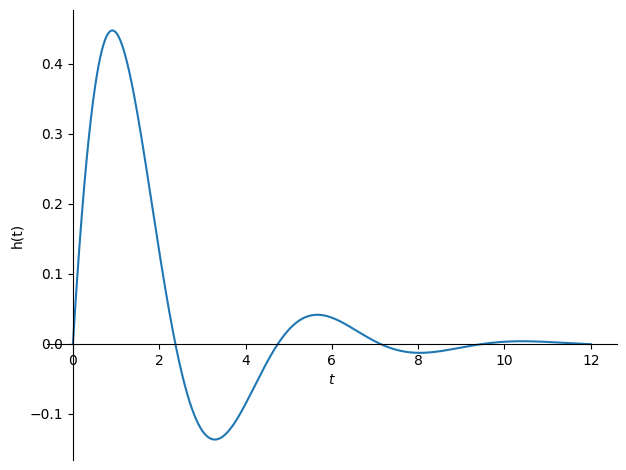

In [80]:
sym.plot(h.rhs, (t,0,12), ylabel=r'h(t)');

Respuesta escalón

In [81]:
solution_u = sym.dsolve(odec.subs(x, sym.Heaviside(t)).subs(y, sym.Function('y_{step}')(t))) #otra vez hay que volver a solucionar la edo con mck ya cambiados por que sino sympy se indetermina :(
solution_u

                                                                  -t        
                                                                  ───       
              ⎛⎛     √7⋅θ(t)⎞    ⎛√7⋅t⎞   ⎛     θ(t)⎞    ⎛√7⋅t⎞⎞   2    θ(t)
y_{step}(t) = ⎜⎜C₁ - ───────⎟⋅sin⎜────⎟ + ⎜C₂ - ────⎟⋅cos⎜────⎟⎟⋅ℯ    + ────
              ⎝⎝       14   ⎠    ⎝ 2  ⎠   ⎝      2  ⎠    ⎝ 2  ⎠⎠         2  

In [82]:
integration_constants = sym.solve( (solution_u.rhs.limit(t, 0, '-'), solution_u.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [83]:
ys = solution_u.subs(integration_constants)
ys

              ⎛        ⎛√7⋅t⎞           ⎛√7⋅t⎞     ⎞  -t        
              ⎜  √7⋅sin⎜────⎟⋅θ(t)   cos⎜────⎟⋅θ(t)⎟  ───       
              ⎜        ⎝ 2  ⎠           ⎝ 2  ⎠     ⎟   2    θ(t)
y_{step}(t) = ⎜- ───────────────── - ──────────────⎟⋅ℯ    + ────
              ⎝         14                 2       ⎠         2  

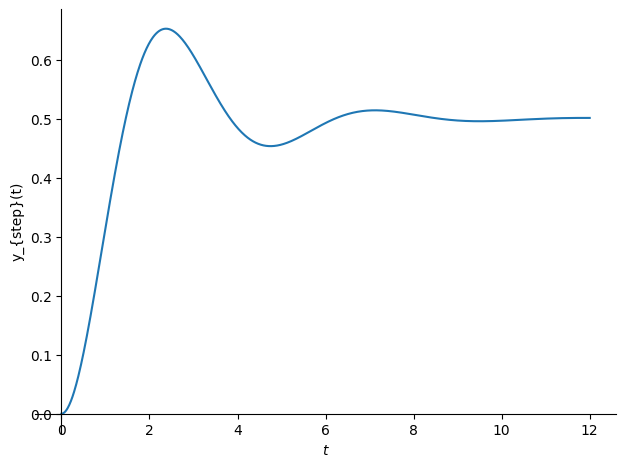

In [84]:
sym.plot(ys.rhs, (t,0,12), ylabel=r'y_{step}(t)');

Respuesta rampa:

In [85]:
solution_r = sym.dsolve(odec.subs(x, t*sym.Heaviside(t)).subs(y, sym.Function('y_{ramp}')(t))) #la rampa es una función lineal que empieza desde 0, por eso la definimos como t*escalon
solution_r #ya mejor soluciono desde la edoc por que no quiero probar si se indetermina

                                                                             - ↪
                                                                             ─ ↪
              t⋅θ(t)   ⎛⎛     3⋅√7⋅θ(t)⎞    ⎛√7⋅t⎞   ⎛     θ(t)⎞    ⎛√7⋅t⎞⎞    ↪
y_{ramp}(t) = ────── + ⎜⎜C₁ - ─────────⎟⋅sin⎜────⎟ + ⎜C₂ + ────⎟⋅cos⎜────⎟⎟⋅ℯ  ↪
                2      ⎝⎝        28    ⎠    ⎝ 2  ⎠   ⎝      4  ⎠    ⎝ 2  ⎠⎠    ↪

↪ t        
↪ ──       
↪ 2    θ(t)
↪    - ────
↪       4  

In [86]:
integration_constants = sym.solve( (solution_r.rhs.limit(t, 0, '-'), solution_r.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] )
integration_constants

{C₁: 0, C₂: 0}

In [87]:
yrf = solution_r.subs(integration_constants)
yrf

                       ⎛          ⎛√7⋅t⎞           ⎛√7⋅t⎞     ⎞  -t        
                       ⎜  3⋅√7⋅sin⎜────⎟⋅θ(t)   cos⎜────⎟⋅θ(t)⎟  ───       
              t⋅θ(t)   ⎜          ⎝ 2  ⎠           ⎝ 2  ⎠     ⎟   2    θ(t)
y_{ramp}(t) = ────── + ⎜- ─────────────────── + ──────────────⎟⋅ℯ    - ────
                2      ⎝          28                  4       ⎠         4  

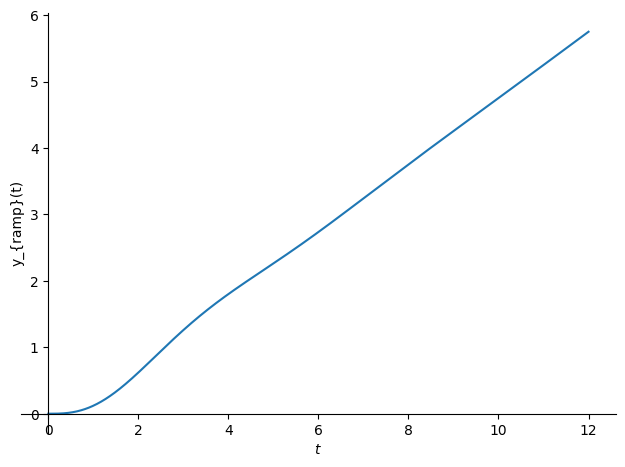

In [88]:
sym.plot(yrf.rhs, (t,0,12), ylabel=r'y_{ramp}(t)');

###Sistema sobreamortiguado

Para que un sistema sea sobreamortiguado debe cumplirse que:

\begin{equation}
ξ>1
\end{equation}

Teniendo esto en cuenta proponemos los valores:

\begin{equation}
a_2=m=C=1
\end{equation}
\begin{equation}
a_1=c=\frac{1}{R}=3
\end{equation}
\begin{equation}
a_0=k+1=\frac{1}{L}+1=2
\end{equation}

Y obtenemos:

\begin{equation}
ξ=\frac{3}{2\sqrt{2*1}}≈1,061
\end{equation}

Con lo cual se cumple el criterio.

La frecuencia natural no amortiguada es:

\begin{equation}
ω_n=\sqrt{\frac{2}{1}}≈1,414
\end{equation}

La frecuencia natural amortiguada es:

\begin{equation}
ω_d=1,414\sqrt{1-1,061^2}≈j0,5
\end{equation}

El tiempo pico es:

\begin{equation}
t_p=\frac{π}{j0,5}≈-j6,283
\end{equation}

El tiempo de establecimiento es:

\begin{equation}
t_s=\frac{3}{1,061*1,414}=2
\end{equation}

Diagrama de polos y ceros:

\begin{equation}
H(s)=\frac{1}{s^2+3s+2}
\end{equation}

In [89]:
coef = [1, 3, 2]   # s^2 + 3s + 2
raices = np.roots(coef)
print(raices)

[-2. -1.]


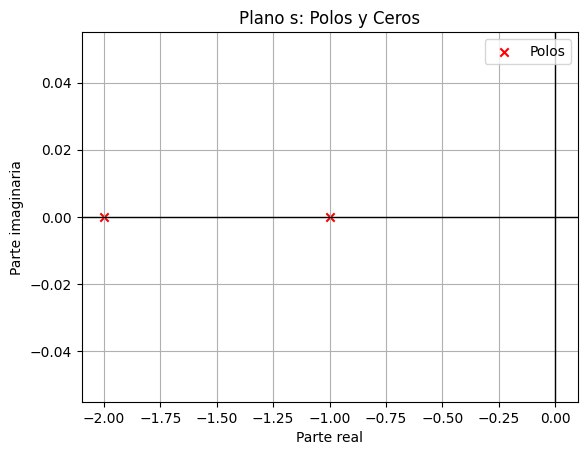

In [90]:
plt.scatter(np.real(raices), np.imag(raices), marker='x', color='r', label='Polos')
plt.axhline(0, color='black', linewidth=1) #ponemos los ejes para que se vea mejor
plt.axvline(0, color='black', linewidth=1)
plt.xlabel('Parte real')
plt.ylabel('Parte imaginaria')
plt.title('Plano s: Polos y Ceros')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

Diagrama de bode:

\begin{equation}
H(w)=\frac{1}{(jw)^2+3(jw)+2}=\frac{1}{-w^2+j3w+2}
\end{equation}

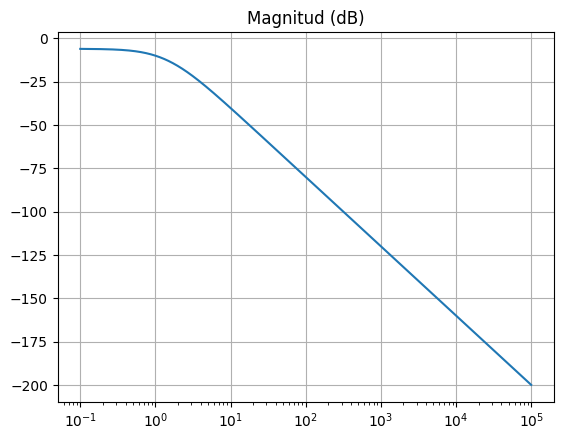

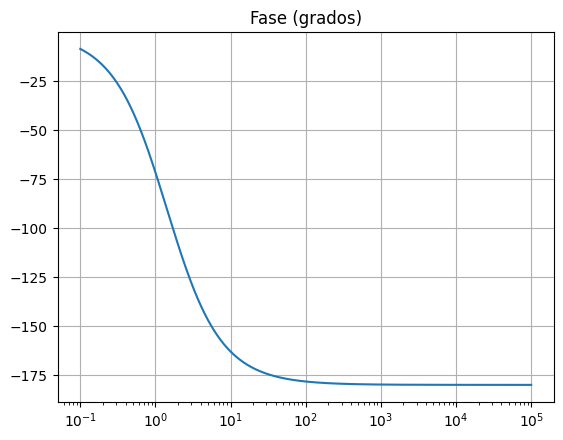

In [91]:
Heval = H(w, 1, 3, 2) #evaluamos la función de transferencia en el vector w
Hmag = 20*np.log10(np.abs(Heval)) #magnitud de H en dB
Hphase = np.angle(Heval, deg=True) #fase de H
plt.figure()
plt.semilogx(w, Hmag) #hace gráfico con eje x logaritmico
plt.grid(True)
plt.title("Magnitud (dB)")

plt.figure()
plt.semilogx(w, Hphase)
plt.grid(True)
plt.title("Fase (grados)")
plt.show()

Continuamos con la respuesta impulso:

In [92]:
mck = {m: 1, c: sym.Rational('3'), k: sym.Rational('1')}
mck

{c: 3, k: 1, m: 1}

In [93]:
odec= ode.subs(mck) #en esta ocasion haremos primero la sustitución ya que sino Sympy se indetermina, usamos solo .subs ya que los parametros no estan a la derecha sino a la izquierda y con eso bastara para que reemplace en toda la ecuacion
odec

                       2              
           d          d               
2⋅y(t) + 3⋅──(y(t)) + ───(y(t)) = x(t)
           dt           2             
                      dt              

In [94]:
solution_h = sym.dsolve(odec.subs(x, sym.DiracDelta(t)).subs(y, sym.Function('h')(t)))
solution_h

       ⎛                  -t       ⎞  -t
h(t) = ⎝C₁ + (C₂ - θ(t))⋅ℯ   + θ(t)⎠⋅ℯ  

In [95]:
integration_constants = sym.solve( (solution_h.rhs.limit(t, 0, '-'), solution_h.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [96]:
h = solution_h.subs(integration_constants)
h

       ⎛        -t     ⎞  -t
h(t) = ⎝θ(t) - ℯ  ⋅θ(t)⎠⋅ℯ  

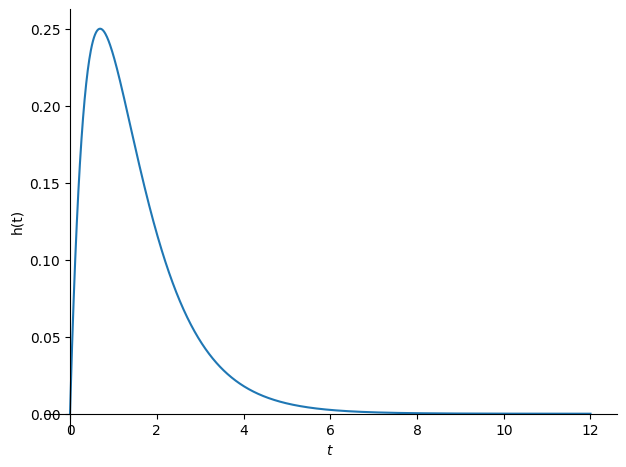

In [97]:
sym.plot(h.rhs, (t,0,12), ylabel=r'h(t)');

Respuesta escalon:

In [98]:
solution_u = sym.dsolve(odec.subs(x, sym.Heaviside(t)).subs(y, sym.Function('y_{step}')(t))) #otra vez hay que volver a solucionar la edo con mck ya cambiados por que sino sympy se indetermina :(
solution_u

                           -t   ⎛     θ(t)⎞  -2⋅t   θ(t)
y_{step}(t) = (C₁ - θ(t))⋅ℯ   + ⎜C₂ + ────⎟⋅ℯ     + ────
                                ⎝      2  ⎠          2  

In [99]:
integration_constants = sym.solve( (solution_u.rhs.limit(t, 0, '-'), solution_u.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [100]:
ys = solution_u.subs(integration_constants)
ys

                                 -2⋅t     
              θ(t)    -t        ℯ    ⋅θ(t)
y_{step}(t) = ──── - ℯ  ⋅θ(t) + ──────────
               2                    2     

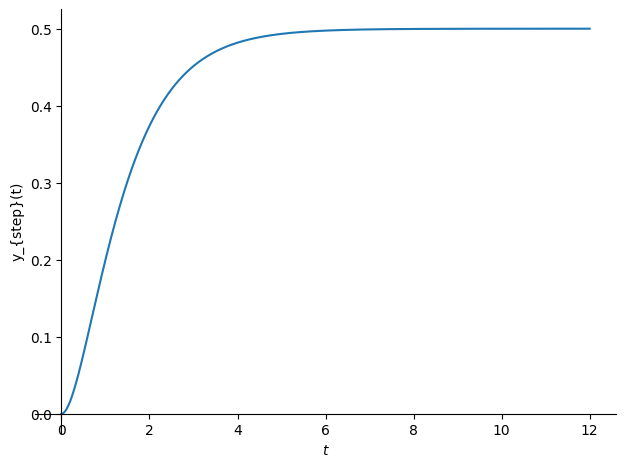

In [101]:
sym.plot(ys.rhs, (t,0,12), ylabel=r'y_{step}(t)');

Respuesta rampa:

In [102]:
solution_r = sym.dsolve(odec.subs(x, t*sym.Heaviside(t)).subs(y, sym.Function('y_{ramp}')(t))) #la rampa es una función lineal que empieza desde 0, por eso la definimos como t*escalon
solution_r #ya mejor soluciono desde la edoc por que no quiero probar si se indetermina

              t⋅θ(t)   ⎛     θ(t)⎞  -2⋅t                -t   3⋅θ(t)
y_{ramp}(t) = ────── + ⎜C₁ - ────⎟⋅ℯ     + (C₂ + θ(t))⋅ℯ   - ──────
                2      ⎝      4  ⎠                             4   

In [103]:
integration_constants = sym.solve( (solution_r.rhs.limit(t, 0, '-'), solution_r.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] )
integration_constants

{C₁: 0, C₂: 0}

In [104]:
yrf = solution_r.subs(integration_constants)
yrf

                                            -2⋅t     
              t⋅θ(t)   3⋅θ(t)    -t        ℯ    ⋅θ(t)
y_{ramp}(t) = ────── - ────── + ℯ  ⋅θ(t) - ──────────
                2        4                     4     

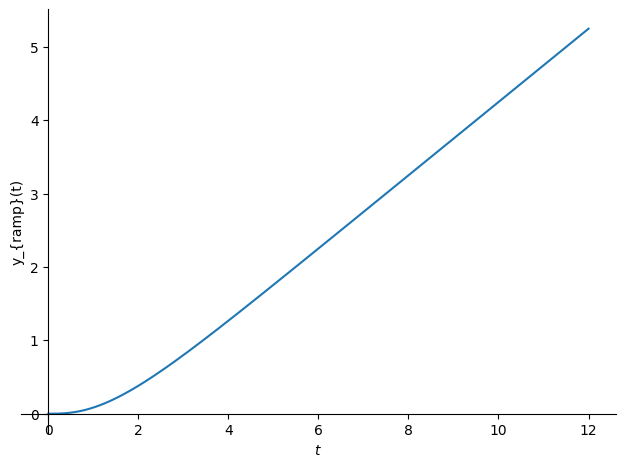

In [105]:
sym.plot(yrf.rhs, (t,0,12), ylabel=r'y_{ramp}(t)');

###Sistema con amortiguamiento critico

Para que un sistema tenga amortiguamiento critico debe cumplirse que

\begin{equation}
ξ=1
\end{equation}

Con eso en mente elegimos los valores:

\begin{equation}
a_2=m=C=2
\end{equation}
\begin{equation}
a_1=c=\frac{1}{R}=4
\end{equation}
\begin{equation}
a_0=k+1=\frac{1}{L}+1=2
\end{equation}

Con lo que el factor de amortiguamiento nos queda:

\begin{equation}
ξ=\frac{4}{2\sqrt{2*2}}=1
\end{equation}

La frecuencia natural no amortiguada queda:

\begin{equation}
ω_n=\sqrt{\frac{2}{2}}=1
\end{equation}

La frecuencia natural amortiguada es:

\begin{equation}
ω_d=1\sqrt{1-1^2}=0
\end{equation}

El tiempo pico es:

\begin{equation}
t_p=\frac{π}{0}=∞
\end{equation}

El tiempo de establecimiento es:

\begin{equation}
t_s=\frac{3}{1*1}=3
\end{equation}

Graficamos polos y ceros:

\begin{equation}
H(s)=\frac{1}{2s^2+4s+2}
\end{equation}

In [106]:
coef = [2, 4, 2]   # 2s^2 + 4s + 2
raices = np.roots(coef)
print(raices)

[-1. -1.]


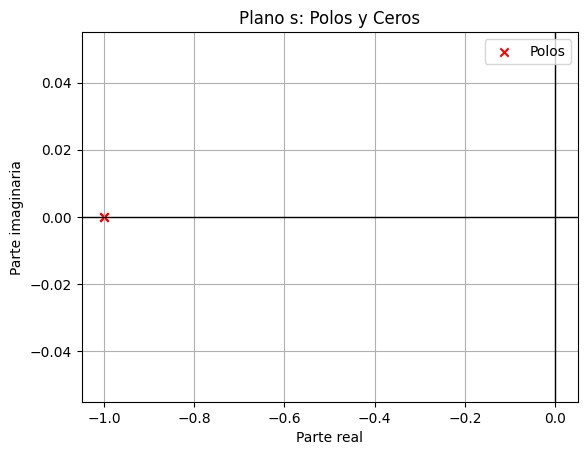

In [107]:
plt.scatter(np.real(raices), np.imag(raices), marker='x', color='r', label='Polos')
plt.axhline(0, color='black', linewidth=1) #ponemos los ejes para que se vea mejor
plt.axvline(0, color='black', linewidth=1)
plt.xlabel('Parte real')
plt.ylabel('Parte imaginaria')
plt.title('Plano s: Polos y Ceros')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

Diagrama de bode:

\begin{equation}
H(w)=\frac{1}{2(jw)^2+4(jw)+2}=\frac{1}{-2w^2+j4w+2}
\end{equation}

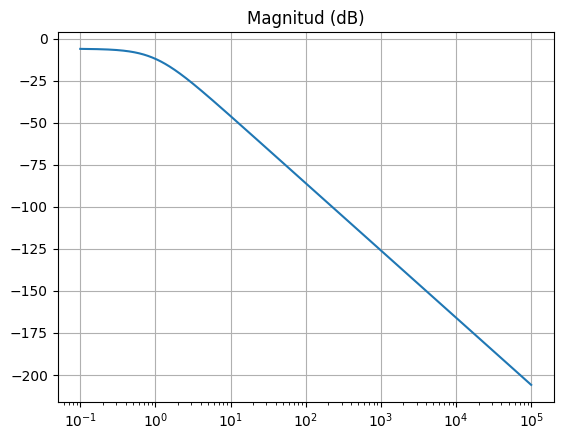

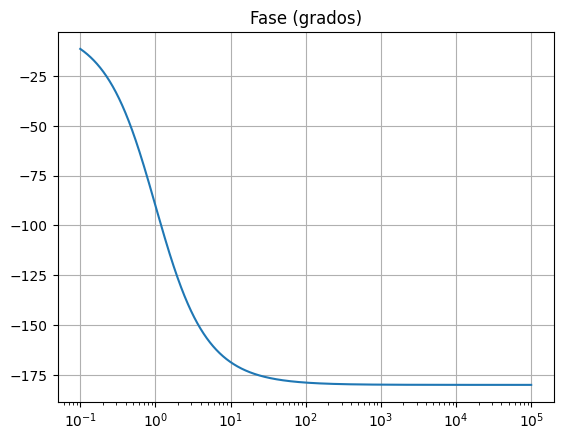

In [108]:
Heval = H(w, 2, 4, 2) #evaluamos la función de transferencia en el vector w
Hmag = 20*np.log10(np.abs(Heval)) #magnitud de H en dB
Hphase = np.angle(Heval, deg=True) #fase de H
plt.figure()
plt.semilogx(w, Hmag) #hace gráfico con eje x logaritmico
plt.grid(True)
plt.title("Magnitud (dB)")

plt.figure()
plt.semilogx(w, Hphase)
plt.grid(True)
plt.title("Fase (grados)")
plt.show()

Respuesta impulso:

In [109]:
mck = {m: 2, c: sym.Rational('4'), k: sym.Rational('1')}
mck

{c: 4, k: 1, m: 2}

In [110]:
odec= ode.subs(mck) #en esta ocasion haremos primero la sustitución ya que sino Sympy se indetermina, usamos solo .subs ya que los parametros no estan a la derecha sino a la izquierda y con eso bastara para que reemplace en toda la ecuacion
odec

                         2              
           d            d               
2⋅y(t) + 4⋅──(y(t)) + 2⋅───(y(t)) = x(t)
           dt             2             
                        dt              

In [111]:
solution_h = sym.dsolve(odec.subs(x, sym.DiracDelta(t)).subs(y, sym.Function('h')(t)))
solution_h

       ⎛       ⎛     θ(t)⎞⎞  -t
h(t) = ⎜C₁ + t⋅⎜C₂ + ────⎟⎟⋅ℯ  
       ⎝       ⎝      2  ⎠⎠    

In [112]:
integration_constants = sym.solve( (solution_h.rhs.limit(t, 0, '-'), solution_h.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [113]:
h = solution_h.subs(integration_constants)
h

          -t     
       t⋅ℯ  ⋅θ(t)
h(t) = ──────────
           2     

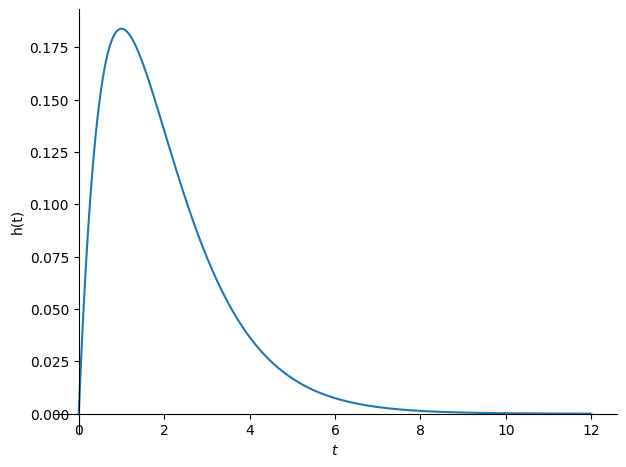

In [114]:
sym.plot(h.rhs, (t,0,12), ylabel=r'h(t)');

Respuesta escalon:

In [115]:
solution_u = sym.dsolve(odec.subs(x, sym.Heaviside(t)).subs(y, sym.Function('y_{step}')(t))) #otra vez hay que volver a solucionar la edo con mck ya cambiados por que sino sympy se indetermina :(
solution_u

              ⎛       ⎛     θ(t)⎞   θ(t)⎞  -t   θ(t)
y_{step}(t) = ⎜C₁ + t⋅⎜C₂ - ────⎟ - ────⎟⋅ℯ   + ────
              ⎝       ⎝      2  ⎠    2  ⎠        2  

In [116]:
integration_constants = sym.solve( (solution_u.rhs.limit(t, 0, '-'), solution_u.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] ) # sym.solve((dupla de expresiones de condiciones iniciales),(dupla de constantes))
integration_constants

{C₁: 0, C₂: 0}

In [117]:
ys = solution_u.subs(integration_constants)
ys

              ⎛  t⋅θ(t)   θ(t)⎞  -t   θ(t)
y_{step}(t) = ⎜- ────── - ────⎟⋅ℯ   + ────
              ⎝    2       2  ⎠        2  

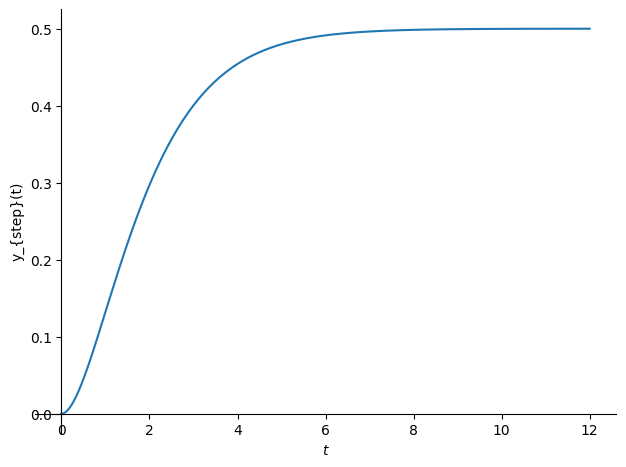

In [118]:
sym.plot(ys.rhs, (t,0,12), ylabel=r'y_{step}(t)');

Respuesta rampa:

In [119]:
solution_r = sym.dsolve(odec.subs(x, t*sym.Heaviside(t)).subs(y, sym.Function('y_{ramp}')(t))) #la rampa es una función lineal que empieza desde 0, por eso la definimos como t*escalon
solution_r #ya mejor soluciono desde la edoc por que no quiero probar si se indetermina

              t⋅θ(t)   ⎛       ⎛     θ(t)⎞       ⎞  -t       
y_{ramp}(t) = ────── + ⎜C₁ + t⋅⎜C₂ + ────⎟ + θ(t)⎟⋅ℯ   - θ(t)
                2      ⎝       ⎝      2  ⎠       ⎠           

In [120]:
integration_constants = sym.solve( (solution_r.rhs.limit(t, 0, '-'), solution_r.rhs.diff(t).limit(t, 0, '-')), ['C1', 'C2'] )
integration_constants

{C₁: 0, C₂: 0}

In [121]:
yrf = solution_r.subs(integration_constants)
yrf

              t⋅θ(t)   ⎛t⋅θ(t)       ⎞  -t       
y_{ramp}(t) = ────── + ⎜────── + θ(t)⎟⋅ℯ   - θ(t)
                2      ⎝  2          ⎠           

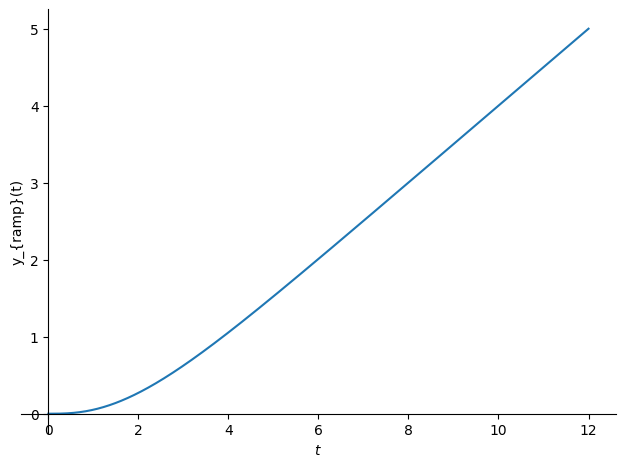

In [122]:
sym.plot(yrf.rhs, (t,0,12), ylabel=r'y_{ramp}(t)');